# I. **Data Collection**
--------------------------------------------------------------------------------

The dataset was sourced from UCI Machine Learning repository; it is comprised of data extracted from Emerging Markets Information Service (EMIS).

- Source: https://archive.ics.uci.edu/dataset/365/polish+companies+bankruptcy+data

- There are 5 subsets of data(containing financial data) based on the interval between reporting period of financial data vs. year of bankruptcy:
 - 1st Year - 5 yrs before       
 - 2nd Year - 4 yrs. before
 - 3rd Year - 3 yrs. before        
 - 4th Year - 2 yrs. before          
 - 5th Year - 1 yrs. before         


In [ ]:
# Import Required Packages


import pandas as pd
from scipy.io import arff # Package to read Attribute-Relation File Format (ARFF)

%matplotlib inline
import numpy as np
from numpy import NAN,nan,NaN

!pip install skimpy
from skimpy import skim

!pip install sidetable
import sidetable

import matplotlib.pylab as plt
from pathlib import Path
import seaborn as sns
from pandas.plotting import scatter_matrix, parallel_coordinates

from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split


from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
import matplotlib.pylab as plt
!pip install dmba
from dmba import plotDecisionTree, classificationSummary, regressionSummary
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV


!pip install dmba
from dmba import regressionSummary, exhaustive_search
from dmba import backward_elimination, forward_selection, stepwise_selection
from dmba import adjusted_r2_score, AIC_score, BIC_score
from sklearn.metrics import r2_score
from dmba import classificationSummary, gainsChart, liftChart
from sklearn.neural_network import MLPClassifier, MLPRegressor

from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
!pip install dmba
from dmba import classificationSummary

from sklearn.tree import DecisionTreeClassifier, export_text


from numpy import arange
from sklearn.linear_model import Ridge
from sklearn.linear_model import RidgeCV
from sklearn.model_selection import RepeatedKFold

#Evaluate the Model Performance
from sklearn.metrics import classification_report
from sklearn.metrics import precision_score,recall_score,f1_score,accuracy_score

import sklearn.metrics as metrics

from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
from sklearn.metrics import roc_curve, auc

!pip install mord
from mord import LogisticIT
import matplotlib.pylab as plt
import seaborn as sns

!pip install dmba
from dmba import classificationSummary, gainsChart, liftChart
from dmba.metric import AIC_score

Colab environment detected.


#----------------------------------------------------Initial Data Preparation-----------------------------------------------

### Data Collection

In [ ]:
# Load and Read the dataset
Year1 = arff.loadarff('/content/1year.arff') # Financial Data 5 years back
Year2 = arff.loadarff('/content/2year.arff') # Financial Data 4 years back
Year3 = arff.loadarff('/content/3year.arff') # Financial Data 3 years back
Year4 = arff.loadarff('/content/4year.arff') # Financial Data 2 years back
Year5 = arff.loadarff('/content/5year.arff') # Financial Data 1 years back

In [ ]:
#Convert arff file into pandas dataframe
Year1 = pd.DataFrame(Year1[0])
Year2 = pd.DataFrame(Year2[0])
Year3 = pd.DataFrame(Year3[0])
Year4 = pd.DataFrame(Year4[0])
Year5 = pd.DataFrame(Year5[0])

In [ ]:
#Set display options
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.expand_frame_repr',None)
pd.set_option('display.width',None)

In [ ]:
#Check dataset structure of each file
print(Year1.shape)
print(Year2.shape)
print(Year3.shape)
print(Year4.shape)
print(Year5.shape)

(7027, 65)
(10173, 65)
(10503, 65)
(9792, 65)
(5910, 65)


In [ ]:
#Check whether five files contain the same set of columns
#If yes, add year tagging and consolidate into one file

def check_columns_match(dataframes):
    first_df = dataframes[0]
    all_match = all(set(Year1.columns) == set(first_df.columns) for df in dataframes)
    return all_match

dfs = [Year1,Year2,Year3,Year4,Year5]
if check_columns_match(dfs):
    print('Yes, all files have the same columns')
else:
    print('Some files have different columns')

Yes, all files have the same columns


In [ ]:
#Add column for the tagging of year_interval, this will be considered as one of input variables
#Interval between financial reporting period vs. observed status

Year1['Year_Interval']= 5
Year2['Year_Interval']= 4
Year3['Year_Interval']= 3
Year4['Year_Interval']= 2
Year5['Year_Interval']= 1

In [ ]:
#Consolidate Yearly files into one dataframe

conso=pd.concat([Year1,Year2,Year3,Year4,Year5],ignore_index=True)
conso.head()

,Attr1,Attr2,Attr3,Attr4,Attr5,Attr6,Attr7,Attr8,Attr9,Attr10,Attr11,Attr12,Attr13,Attr14,Attr15,Attr16,Attr17,Attr18,Attr19,Attr20,Attr21,Attr22,Attr23,Attr24,Attr25,Attr26,Attr27,Attr28,Attr29,Attr30,Attr31,Attr32,Attr33,Attr34,Attr35,Attr36,Attr37,Attr38,Attr39,Attr40,Attr41,Attr42,Attr43,Attr44,Attr45,Attr46,Attr47,Attr48,Attr49,Attr50,Attr51,Attr52,Attr53,Attr54,Attr55,Attr56,Attr57,Attr58,Attr59,Attr60,Attr61,Attr62,Attr63,Attr64,class,Year_Interval
0,0.200550,0.37951,0.39641,2.0472,32.3510,0.38825,0.249760,1.33050,1.1389,0.50494,0.249760,0.65980,0.166600,0.249760,497.42,0.73378,2.6349,0.249760,0.149420,43.370,1.2479,0.21402,0.119980,0.47706,0.50494,0.60411,1.45820,1.7615,5.9443,0.11788,0.149420,94.14,3.8772,0.56393,0.21402,1.7410,593.2700,0.50591,0.128040,0.662950,0.051402,0.128040,114.42,71.050,1.00970,1.52250,49.394,0.185300,0.110850,2.0420,0.37854,0.25792,2.2437,2.2480,348690.0,0.121960,0.39718,0.87804,0.001924,8.4160,5.1372,82.658,4.4158,7.4277,b'0',5
1,0.209120,0.49988,0.47225,1.9447,14.7860,0.00000,0.258340,0.99601,1.6996,0.49788,0.261140,0.51680,0.158350,0.258340,677.96,0.53838,2.0005,0.258340,0.152000,87.981,1.4293,0.24806,0.123040,NaN,0.39542,0.43992,88.44400,16.9460,3.6884,0.26969,0.152000,122.17,2.9876,2.98760,0.20616,1.6996,NaN,0.49788,0.121300,0.086422,0.064371,0.145950,199.49,111.510,0.51045,1.12520,100.130,0.237270,0.139610,1.9447,0.49988,0.33472,17.8660,17.8660,2304.6,0.121300,0.42002,0.85300,0.000000,4.1486,3.2732,107.350,3.4000,60.9870,b'0',5
2,0.248660,0.69592,0.26713,1.5548,-1.1523,0.00000,0.309060,0.43695,1.3090,0.30408,0.312580,0.64184,0.244350,0.309060,794.16,0.45961,1.4369,0.309060,0.236100,73.133,1.4283,0.30260,0.189960,NaN,0.28932,0.37282,86.01100,1.0627,4.3749,0.41929,0.238150,176.93,2.0630,1.42740,0.31565,1.3090,2.3019,0.51537,0.241140,0.322020,0.074020,0.231170,165.51,92.381,0.94807,1.01010,96.372,0.291810,0.222930,1.0758,0.48152,0.48474,1.2098,2.0504,6332.7,0.241140,0.81774,0.76599,0.694840,4.9909,3.9510,134.270,2.7185,5.2078,b'0',5
3,0.081483,0.30734,0.45879,2.4928,51.9520,0.14988,0.092704,1.86610,1.0571,0.57353,0.092704,0.30163,0.094257,0.092704,917.01,0.39803,3.2537,0.092704,0.071428,79.788,1.5069,0.11550,0.062782,0.17193,0.57353,0.36152,0.94076,1.9618,4.6511,0.14343,0.071428,91.37,3.9948,0.37581,0.11550,1.3562,NaN,0.57353,0.088995,0.401390,0.069622,0.088995,180.77,100.980,0.28720,1.56960,84.344,0.085874,0.066165,2.4928,0.30734,0.25033,2.4524,2.4524,20545.0,0.054015,0.14207,0.94598,0.000000,4.5746,3.6147,86.435,4.2228,5.5497,b'0',5
4,0.187320,0.61323,0.22960,1.4063,-7.3128,0.18732,0.187320,0.63070,1.1559,0.38677,0.187320,0.33147,0.121820,0.187320,1133.20,0.32211,1.6307,0.187320,0.115530,57.045,NaN,0.19832,0.115530,0.18732,0.38677,0.32211,1.41380,1.1184,4.1424,0.27884,0.115530,147.04,2.4823,0.32340,0.19832,1.6278,11.2470,0.43489,0.122310,0.293040,0.096680,0.122310,141.62,84.574,0.73919,0.95787,65.936,0.188110,0.116010,1.2959,0.56511,0.40285,1.8839,2.1184,3186.6,0.134850,0.48431,0.86515,0.124440,6.3985,4.3158,127.210,2.8692,7.8980,b'0',5


### Renaming the Attributes

*Comments*: Naming convention is structured according to metric classification and unit of measure

* Initial label indicates metric class
 - *E: efficiency, G:growth, L: liquidity, P: profitability, S: solvency, V: leverage*

* Last letter indicates unit of measure
 - *R: ratio, D: days, T: turnover, I:index*

In [ ]:
#Rename the columns for better interpretability

conso.columns=['P_ROA(NI)_R','S_Debt_Asset_R','L_WorkCap_Asset_R','L_Current_Ratio_R','L_DLAO_D','V_RE_Asset_R','P_ROA(EBIT)_R','S_BVE_TotalLiab_R',
               'E_Asset_TO_T','V_Equity_Asset_R','P_ROA(GP+Eo+FinEx)_R','S_GP_StLiab_R','P_GP+Dep_Margin_R','P_ROA(GP&IntEx)_R','L_DLO_GP+Dep_D',
               'S_GP+Dep_TotalLiab_R','V_Asset_Debt_R','P_ROA(GP)_R','P_GP_Margin_R','E_DIO_Sales_D','G_SlsG%Index_I','P_ROA(OP)_R','P_NP_Margin_R',
               'P_ROA(3yr_GP)_R','V_Equity(ex-SC)_Asset_R','S_NP+Dep_TotalLiab_R','S_Financial_Coverage_R','L_WorkCap_FixAsset_R','Log_TAsset',
               'V_TotalLiab(ex-Cash)_Sales_R','P_GP+IntEx_Margin_R','L_DCPO_D','L_Opex_StLiab_R','L_Opex_TotalLiab_R','P_ROA(GP2)_R','E_Asset_TO2_T',
               'L_QuickAsset_LtLiab_R','V_ConstCap_Asset_R','P_GP_Margin2_R','L_QuickAsset(ex-AR)_StLiab_R','S_TotalLiab_DailyEBITDA_R','P_OP_Margin_R',
               'L_CashConversion(inc.DPO)_D','L_DSO_D','P_ROA(NI_Inv)_R','L_QuickAsset_StLiab_R','E_DIO_COGS_D','P_ROA(EBITDA)_R','P_EBITDA_Margin_R',
               'L_CurAsset_TotalLiab_R','V_StLiab_Asset_R','L_DSPO_D','V_Equity_FixAsset_R','L_ConstCap_FixedAsset_R','L_WorkCap_A','P_GP_Margin3_R',
               'L_QuickWorkCap_NetCost_R','P_TotalCost_Sales_R','V_LtLiab_Equity_R','E_Inventory_TO_T','E_Receivable_TO_T','L_DPO_Sales_D','E_StLiab_TO_T',
               'E_FixAsset_TO_T','Bankrupt','Year_Interval']

conso.head()

,P_ROA(NI)_R,S_Debt_Asset_R,L_WorkCap_Asset_R,L_Current_Ratio_R,L_DLAO_D,V_RE_Asset_R,P_ROA(EBIT)_R,S_BVE_TotalLiab_R,E_Asset_TO_T,V_Equity_Asset_R,P_ROA(GP+Eo+FinEx)_R,S_GP_StLiab_R,P_GP+Dep_Margin_R,P_ROA(GP&IntEx)_R,L_DLO_GP+Dep_D,S_GP+Dep_TotalLiab_R,V_Asset_Debt_R,P_ROA(GP)_R,P_GP_Margin_R,E_DIO_Sales_D,G_SlsG%Index_I,P_ROA(OP)_R,P_NP_Margin_R,P_ROA(3yr_GP)_R,V_Equity(ex-SC)_Asset_R,S_NP+Dep_TotalLiab_R,S_Financial_Coverage_R,L_WorkCap_FixAsset_R,Log_TAsset,V_TotalLiab(ex-Cash)_Sales_R,P_GP+IntEx_Margin_R,L_DCPO_D,L_Opex_StLiab_R,L_Opex_TotalLiab_R,P_ROA(GP2)_R,E_Asset_TO2_T,L_QuickAsset_LtLiab_R,V_ConstCap_Asset_R,P_GP_Margin2_R,L_QuickAsset(ex-AR)_StLiab_R,S_TotalLiab_DailyEBITDA_R,P_OP_Margin_R,L_CashConversion(inc.DPO)_D,L_DSO_D,P_ROA(NI_Inv)_R,L_QuickAsset_StLiab_R,E_DIO_COGS_D,P_ROA(EBITDA)_R,P_EBITDA_Margin_R,L_CurAsset_TotalLiab_R,V_StLiab_Asset_R,L_DSPO_D,V_Equity_FixAsset_R,L_ConstCap_FixedAsset_R,L_WorkCap_A,P_GP_Margin3_R,L_QuickWorkCap_NetCost_R,P_TotalCost_Sales_R,V_LtLiab_Equity_R,E_Inventory_TO_T,E_Receivable_TO_T,L_DPO_Sales_D,E_StLiab_TO_T,E_FixAsset_TO_T,Bankrupt,Year_Interval
0,0.200550,0.37951,0.39641,2.0472,32.3510,0.38825,0.249760,1.33050,1.1389,0.50494,0.249760,0.65980,0.166600,0.249760,497.42,0.73378,2.6349,0.249760,0.149420,43.370,1.2479,0.21402,0.119980,0.47706,0.50494,0.60411,1.45820,1.7615,5.9443,0.11788,0.149420,94.14,3.8772,0.56393,0.21402,1.7410,593.2700,0.50591,0.128040,0.662950,0.051402,0.128040,114.42,71.050,1.00970,1.52250,49.394,0.185300,0.110850,2.0420,0.37854,0.25792,2.2437,2.2480,348690.0,0.121960,0.39718,0.87804,0.001924,8.4160,5.1372,82.658,4.4158,7.4277,b'0',5
1,0.209120,0.49988,0.47225,1.9447,14.7860,0.00000,0.258340,0.99601,1.6996,0.49788,0.261140,0.51680,0.158350,0.258340,677.96,0.53838,2.0005,0.258340,0.152000,87.981,1.4293,0.24806,0.123040,NaN,0.39542,0.43992,88.44400,16.9460,3.6884,0.26969,0.152000,122.17,2.9876,2.98760,0.20616,1.6996,NaN,0.49788,0.121300,0.086422,0.064371,0.145950,199.49,111.510,0.51045,1.12520,100.130,0.237270,0.139610,1.9447,0.49988,0.33472,17.8660,17.8660,2304.6,0.121300,0.42002,0.85300,0.000000,4.1486,3.2732,107.350,3.4000,60.9870,b'0',5
2,0.248660,0.69592,0.26713,1.5548,-1.1523,0.00000,0.309060,0.43695,1.3090,0.30408,0.312580,0.64184,0.244350,0.309060,794.16,0.45961,1.4369,0.309060,0.236100,73.133,1.4283,0.30260,0.189960,NaN,0.28932,0.37282,86.01100,1.0627,4.3749,0.41929,0.238150,176.93,2.0630,1.42740,0.31565,1.3090,2.3019,0.51537,0.241140,0.322020,0.074020,0.231170,165.51,92.381,0.94807,1.01010,96.372,0.291810,0.222930,1.0758,0.48152,0.48474,1.2098,2.0504,6332.7,0.241140,0.81774,0.76599,0.694840,4.9909,3.9510,134.270,2.7185,5.2078,b'0',5
3,0.081483,0.30734,0.45879,2.4928,51.9520,0.14988,0.092704,1.86610,1.0571,0.57353,0.092704,0.30163,0.094257,0.092704,917.01,0.39803,3.2537,0.092704,0.071428,79.788,1.5069,0.11550,0.062782,0.17193,0.57353,0.36152,0.94076,1.9618,4.6511,0.14343,0.071428,91.37,3.9948,0.37581,0.11550,1.3562,NaN,0.57353,0.088995,0.401390,0.069622,0.088995,180.77,100.980,0.28720,1.56960,84.344,0.085874,0.066165,2.4928,0.30734,0.25033,2.4524,2.4524,20545.0,0.054015,0.14207,0.94598,0.000000,4.5746,3.6147,86.435,4.2228,5.5497,b'0',5
4,0.187320,0.61323,0.22960,1.4063,-7.3128,0.18732,0.187320,0.63070,1.1559,0.38677,0.187320,0.33147,0.121820,0.187320,1133.20,0.32211,1.6307,0.187320,0.115530,57.045,NaN,0.19832,0.115530,0.18732,0.38677,0.32211,1.41380,1.1184,4.1424,0.27884,0.115530,147.04,2.4823,0.32340,0.19832,1.6278,11.2470,0.43489,0.122310,0.293040,0.096680,0.122310,141.62,84.574,0.73919,0.95787,65.936,0.188110,0.116010,1.2959,0.56511,0.40285,1.8839,2.1184,3186.6,0.134850,0.48431,0.86515,0.124440,6.3985,4.3158,127.210,2.8692,7.8980,b'0',5


In [ ]:
#Reorder columns

reorder_column=['Bankrupt','Year_Interval','Log_TAsset','E_Asset_TO_T','E_Asset_TO2_T','E_Inventory_TO_T','E_Receivable_TO_T','E_StLiab_TO_T',
                'E_FixAsset_TO_T','E_DIO_Sales_D','E_DIO_COGS_D','G_SlsG%Index_I','L_WorkCap_Asset_R','L_Current_Ratio_R','L_WorkCap_FixAsset_R',
                'L_Opex_StLiab_R','L_Opex_TotalLiab_R','L_QuickAsset_LtLiab_R','L_QuickAsset(ex-AR)_StLiab_R','L_QuickAsset_StLiab_R',
                'L_CurAsset_TotalLiab_R','L_ConstCap_FixedAsset_R','L_QuickWorkCap_NetCost_R','L_DLAO_D','L_DLO_GP+Dep_D','L_DCPO_D',
                'L_CashConversion(inc.DPO)_D','L_DSO_D','L_DSPO_D','L_DPO_Sales_D','L_WorkCap_A','P_ROA(NI)_R','P_ROA(EBIT)_R','P_ROA(GP+Eo+FinEx)_R',
                'P_GP+Dep_Margin_R','P_ROA(GP&IntEx)_R','P_ROA(GP)_R','P_GP_Margin_R','P_ROA(OP)_R','P_NP_Margin_R','P_ROA(3yr_GP)_R','P_GP+IntEx_Margin_R',
                'P_ROA(GP2)_R','P_GP_Margin2_R','P_OP_Margin_R','P_ROA(NI_Inv)_R','P_ROA(EBITDA)_R','P_EBITDA_Margin_R','P_GP_Margin3_R','P_TotalCost_Sales_R',
                'S_Debt_Asset_R','S_BVE_TotalLiab_R','S_GP_StLiab_R','S_GP+Dep_TotalLiab_R','S_NP+Dep_TotalLiab_R','S_Financial_Coverage_R',
                'S_TotalLiab_DailyEBITDA_R','V_RE_Asset_R','V_Equity_Asset_R','V_Asset_Debt_R','V_Equity(ex-SC)_Asset_R','V_TotalLiab(ex-Cash)_Sales_R',
                'V_ConstCap_Asset_R','V_StLiab_Asset_R','V_Equity_FixAsset_R','V_LtLiab_Equity_R']

conso = conso[reorder_column]

conso.head()

,Bankrupt,Year_Interval,Log_TAsset,E_Asset_TO_T,E_Asset_TO2_T,E_Inventory_TO_T,E_Receivable_TO_T,E_StLiab_TO_T,E_FixAsset_TO_T,E_DIO_Sales_D,E_DIO_COGS_D,G_SlsG%Index_I,L_WorkCap_Asset_R,L_Current_Ratio_R,L_WorkCap_FixAsset_R,L_Opex_StLiab_R,L_Opex_TotalLiab_R,L_QuickAsset_LtLiab_R,L_QuickAsset(ex-AR)_StLiab_R,L_QuickAsset_StLiab_R,L_CurAsset_TotalLiab_R,L_ConstCap_FixedAsset_R,L_QuickWorkCap_NetCost_R,L_DLAO_D,L_DLO_GP+Dep_D,L_DCPO_D,L_CashConversion(inc.DPO)_D,L_DSO_D,L_DSPO_D,L_DPO_Sales_D,L_WorkCap_A,P_ROA(NI)_R,P_ROA(EBIT)_R,P_ROA(GP+Eo+FinEx)_R,P_GP+Dep_Margin_R,P_ROA(GP&IntEx)_R,P_ROA(GP)_R,P_GP_Margin_R,P_ROA(OP)_R,P_NP_Margin_R,P_ROA(3yr_GP)_R,P_GP+IntEx_Margin_R,P_ROA(GP2)_R,P_GP_Margin2_R,P_OP_Margin_R,P_ROA(NI_Inv)_R,P_ROA(EBITDA)_R,P_EBITDA_Margin_R,P_GP_Margin3_R,P_TotalCost_Sales_R,S_Debt_Asset_R,S_BVE_TotalLiab_R,S_GP_StLiab_R,S_GP+Dep_TotalLiab_R,S_NP+Dep_TotalLiab_R,S_Financial_Coverage_R,S_TotalLiab_DailyEBITDA_R,V_RE_Asset_R,V_Equity_Asset_R,V_Asset_Debt_R,V_Equity(ex-SC)_Asset_R,V_TotalLiab(ex-Cash)_Sales_R,V_ConstCap_Asset_R,V_StLiab_Asset_R,V_Equity_FixAsset_R,V_LtLiab_Equity_R
0,b'0',5,5.9443,1.1389,1.7410,8.4160,5.1372,4.4158,7.4277,43.370,49.394,1.2479,0.39641,2.0472,1.7615,3.8772,0.56393,593.2700,0.662950,1.52250,2.0420,2.2480,0.39718,32.3510,497.42,94.14,114.42,71.050,0.25792,82.658,348690.0,0.200550,0.249760,0.249760,0.166600,0.249760,0.249760,0.149420,0.21402,0.119980,0.47706,0.149420,0.21402,0.128040,0.128040,1.00970,0.185300,0.110850,0.121960,0.87804,0.37951,1.33050,0.65980,0.73378,0.60411,1.45820,0.051402,0.38825,0.50494,2.6349,0.50494,0.11788,0.50591,0.37854,2.2437,0.001924
1,b'0',5,3.6884,1.6996,1.6996,4.1486,3.2732,3.4000,60.9870,87.981,100.130,1.4293,0.47225,1.9447,16.9460,2.9876,2.98760,NaN,0.086422,1.12520,1.9447,17.8660,0.42002,14.7860,677.96,122.17,199.49,111.510,0.33472,107.350,2304.6,0.209120,0.258340,0.261140,0.158350,0.258340,0.258340,0.152000,0.24806,0.123040,NaN,0.152000,0.20616,0.121300,0.145950,0.51045,0.237270,0.139610,0.121300,0.85300,0.49988,0.99601,0.51680,0.53838,0.43992,88.44400,0.064371,0.00000,0.49788,2.0005,0.39542,0.26969,0.49788,0.49988,17.8660,0.000000
2,b'0',5,4.3749,1.3090,1.3090,4.9909,3.9510,2.7185,5.2078,73.133,96.372,1.4283,0.26713,1.5548,1.0627,2.0630,1.42740,2.3019,0.322020,1.01010,1.0758,2.0504,0.81774,-1.1523,794.16,176.93,165.51,92.381,0.48474,134.270,6332.7,0.248660,0.309060,0.312580,0.244350,0.309060,0.309060,0.236100,0.30260,0.189960,NaN,0.238150,0.31565,0.241140,0.231170,0.94807,0.291810,0.222930,0.241140,0.76599,0.69592,0.43695,0.64184,0.45961,0.37282,86.01100,0.074020,0.00000,0.30408,1.4369,0.28932,0.41929,0.51537,0.48152,1.2098,0.694840
3,b'0',5,4.6511,1.0571,1.3562,4.5746,3.6147,4.2228,5.5497,79.788,84.344,1.5069,0.45879,2.4928,1.9618,3.9948,0.37581,NaN,0.401390,1.56960,2.4928,2.4524,0.14207,51.9520,917.01,91.37,180.77,100.980,0.25033,86.435,20545.0,0.081483,0.092704,0.092704,0.094257,0.092704,0.092704,0.071428,0.11550,0.062782,0.17193,0.071428,0.11550,0.088995,0.088995,0.28720,0.085874,0.066165,0.054015,0.94598,0.30734,1.86610,0.30163,0.39803,0.36152,0.94076,0.069622,0.14988,0.57353,3.2537,0.57353,0.14343,0.57353,0.30734,2.4524,0.000000
4,b'0',5,4.1424,1.1559,1.6278,6.3985,4.3158,2.8692,7.8980,57.045,65.936,NaN,0.22960,1.4063,1.1184,2.4823,0.32340,11.2470,0.293040,0.95787,1.2959,2.1184,0.48431,-7.3128,1133.20,147.04,141.62,84.574,0.40285,127.210,3186.6,0.187320,0.187320,0.187320,0.121820,0.187320,0.187320,0.115530,0.19832,0.115530,0.18732,0.115530,0.19832,0.122310,0.122310,0.73919,0.188110,0.116010,0.134850,0.86515,0.61323,0.63070,0.33147,0.32211,0.32211,1.41380,0.096680,0.18732,0.38677,1.6307,0.38677,0.27884,0.43489,0.56511,1.8839,0.124440


In [ ]:
#Convert target variable into binary integers
conso['Bankrupt']=conso['Bankrupt'].astype('category').astype('int')
conso.head()

,Bankrupt,Year_Interval,Log_TAsset,E_Asset_TO_T,E_Asset_TO2_T,E_Inventory_TO_T,E_Receivable_TO_T,E_StLiab_TO_T,E_FixAsset_TO_T,E_DIO_Sales_D,E_DIO_COGS_D,G_SlsG%Index_I,L_WorkCap_Asset_R,L_Current_Ratio_R,L_WorkCap_FixAsset_R,L_Opex_StLiab_R,L_Opex_TotalLiab_R,L_QuickAsset_LtLiab_R,L_QuickAsset(ex-AR)_StLiab_R,L_QuickAsset_StLiab_R,L_CurAsset_TotalLiab_R,L_ConstCap_FixedAsset_R,L_QuickWorkCap_NetCost_R,L_DLAO_D,L_DLO_GP+Dep_D,L_DCPO_D,L_CashConversion(inc.DPO)_D,L_DSO_D,L_DSPO_D,L_DPO_Sales_D,L_WorkCap_A,P_ROA(NI)_R,P_ROA(EBIT)_R,P_ROA(GP+Eo+FinEx)_R,P_GP+Dep_Margin_R,P_ROA(GP&IntEx)_R,P_ROA(GP)_R,P_GP_Margin_R,P_ROA(OP)_R,P_NP_Margin_R,P_ROA(3yr_GP)_R,P_GP+IntEx_Margin_R,P_ROA(GP2)_R,P_GP_Margin2_R,P_OP_Margin_R,P_ROA(NI_Inv)_R,P_ROA(EBITDA)_R,P_EBITDA_Margin_R,P_GP_Margin3_R,P_TotalCost_Sales_R,S_Debt_Asset_R,S_BVE_TotalLiab_R,S_GP_StLiab_R,S_GP+Dep_TotalLiab_R,S_NP+Dep_TotalLiab_R,S_Financial_Coverage_R,S_TotalLiab_DailyEBITDA_R,V_RE_Asset_R,V_Equity_Asset_R,V_Asset_Debt_R,V_Equity(ex-SC)_Asset_R,V_TotalLiab(ex-Cash)_Sales_R,V_ConstCap_Asset_R,V_StLiab_Asset_R,V_Equity_FixAsset_R,V_LtLiab_Equity_R
0,0,5,5.9443,1.1389,1.7410,8.4160,5.1372,4.4158,7.4277,43.370,49.394,1.2479,0.39641,2.0472,1.7615,3.8772,0.56393,593.2700,0.662950,1.52250,2.0420,2.2480,0.39718,32.3510,497.42,94.14,114.42,71.050,0.25792,82.658,348690.0,0.200550,0.249760,0.249760,0.166600,0.249760,0.249760,0.149420,0.21402,0.119980,0.47706,0.149420,0.21402,0.128040,0.128040,1.00970,0.185300,0.110850,0.121960,0.87804,0.37951,1.33050,0.65980,0.73378,0.60411,1.45820,0.051402,0.38825,0.50494,2.6349,0.50494,0.11788,0.50591,0.37854,2.2437,0.001924
1,0,5,3.6884,1.6996,1.6996,4.1486,3.2732,3.4000,60.9870,87.981,100.130,1.4293,0.47225,1.9447,16.9460,2.9876,2.98760,NaN,0.086422,1.12520,1.9447,17.8660,0.42002,14.7860,677.96,122.17,199.49,111.510,0.33472,107.350,2304.6,0.209120,0.258340,0.261140,0.158350,0.258340,0.258340,0.152000,0.24806,0.123040,NaN,0.152000,0.20616,0.121300,0.145950,0.51045,0.237270,0.139610,0.121300,0.85300,0.49988,0.99601,0.51680,0.53838,0.43992,88.44400,0.064371,0.00000,0.49788,2.0005,0.39542,0.26969,0.49788,0.49988,17.8660,0.000000
2,0,5,4.3749,1.3090,1.3090,4.9909,3.9510,2.7185,5.2078,73.133,96.372,1.4283,0.26713,1.5548,1.0627,2.0630,1.42740,2.3019,0.322020,1.01010,1.0758,2.0504,0.81774,-1.1523,794.16,176.93,165.51,92.381,0.48474,134.270,6332.7,0.248660,0.309060,0.312580,0.244350,0.309060,0.309060,0.236100,0.30260,0.189960,NaN,0.238150,0.31565,0.241140,0.231170,0.94807,0.291810,0.222930,0.241140,0.76599,0.69592,0.43695,0.64184,0.45961,0.37282,86.01100,0.074020,0.00000,0.30408,1.4369,0.28932,0.41929,0.51537,0.48152,1.2098,0.694840
3,0,5,4.6511,1.0571,1.3562,4.5746,3.6147,4.2228,5.5497,79.788,84.344,1.5069,0.45879,2.4928,1.9618,3.9948,0.37581,NaN,0.401390,1.56960,2.4928,2.4524,0.14207,51.9520,917.01,91.37,180.77,100.980,0.25033,86.435,20545.0,0.081483,0.092704,0.092704,0.094257,0.092704,0.092704,0.071428,0.11550,0.062782,0.17193,0.071428,0.11550,0.088995,0.088995,0.28720,0.085874,0.066165,0.054015,0.94598,0.30734,1.86610,0.30163,0.39803,0.36152,0.94076,0.069622,0.14988,0.57353,3.2537,0.57353,0.14343,0.57353,0.30734,2.4524,0.000000
4,0,5,4.1424,1.1559,1.6278,6.3985,4.3158,2.8692,7.8980,57.045,65.936,NaN,0.22960,1.4063,1.1184,2.4823,0.32340,11.2470,0.293040,0.95787,1.2959,2.1184,0.48431,-7.3128,1133.20,147.04,141.62,84.574,0.40285,127.210,3186.6,0.187320,0.187320,0.187320,0.121820,0.187320,0.187320,0.115530,0.19832,0.115530,0.18732,0.115530,0.19832,0.122310,0.122310,0.73919,0.188110,0.116010,0.134850,0.86515,0.61323,0.63070,0.33147,0.32211,0.32211,1.41380,0.096680,0.18732,0.38677,1.6307,0.38677,0.27884,0.43489,0.56511,1.8839,0.124440


#----------------------------------------------------Data Exploration----------------------------------------------------

## Dataset Structure

In [ ]:
#Shape of the Dataset
print(conso.shape)

(43405, 66)


* The consolidated and updated dataset has a total 43,405 observations and 66 variables

In [ ]:
# Skimpy Summary
skim(conso)

╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│          Data Summary                Data Types                                                                 │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓                                                          │
│ ┃ dataframe         ┃ Values ┃ ┃ Column Type ┃ Count ┃                                                          │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩                                                          │
│ │ Number of rows    │ 43405  │ │ float64     │ 64    │                                                          │
│ │ Number of columns │ 66     │ │ int64       │ 2     │                                                          │
│ └───────────────────┴────────┘ └─────────────┴───────┘                                                          │
│                                                     number                                                      │
│ ┏━━━━━━━━━━┳━━━━━━━┳━━━━━━━┳━━━━━━━━━━┳━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━┳━━━━━━━━━┳━━━━━━━━┓  │
│ ┃ column_n ┃       ┃       ┃          ┃        ┃          ┃          ┃          ┃         ┃         ┃        ┃  │
│ ┃ ame      ┃ NA    ┃ NA %  ┃ mean     ┃ sd     ┃ p0       ┃ p25      ┃ p50      ┃ p75     ┃ p100    ┃ hist   ┃  │
│ ┡━━━━━━━━━━╇━━━━━━━╇━━━━━━━╇━━━━━━━━━━╇━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━╇━━━━━━━━━╇━━━━━━━━┩  │
│ │ Bankrupt │     0 │     0 │  0.04817 │ 0.2141 │        0 │        0 │        0 │       0 │       1 │   ▇    │  │
│ │ Year_Int │     0 │     0 │     3.06 │  1.284 │        1 │        2 │        3 │       4 │       5 │ ▅▇ ▇▇▅ │  │
│ │ erval    │       │       │          │        │          │          │          │         │         │        │  │
│ │ Log_TAss │     8 │  0.02 │    4.005 │ 0.8269 │  -0.8861 │    3.495 │    4.014 │    4.52 │   9.698 │   ▁▇▃  │  │
│ │ et       │       │       │          │        │          │          │          │         │         │        │  │
│ │ E_Asset_ │     9 │  0.02 │    2.652 │  62.93 │   -3.496 │    1.018 │    1.195 │   2.062 │    9742 │   ▇    │  │
│ │ TO_T     │       │       │          │        │          │          │          │         │         │        │  │
│ │ E_Asset_ │     8 │  0.02 │    2.911 │  62.98 │ -0.00085 │    1.101 │    1.643 │   2.421 │    9742 │   ▇    │  │
│ │ TO2_T    │       │       │          │        │       72 │          │          │         │         │        │  │
│ │ E_Invent │  2152 │  4.96 │    448.1 │  32350 │   -12.44 │    5.545 │    9.792 │   20.18 │ 4819000 │   ▇    │  │
│ │ ory_TO_T │       │       │          │        │          │          │          │         │         │        │  │
│ │ E_Receiv │   102 │  0.23 │    17.03 │    553 │   -12.66 │     4.51 │    6.636 │   10.39 │  108000 │   ▇    │  │
│ │ able_TO_ │       │       │          │        │          │          │          │         │         │        │  │
│ │ T        │       │       │          │        │          │          │          │         │         │        │  │
│ │ E_StLiab │   134 │  0.31 │    9.343 │  124.2 │   -1.543 │    3.098 │    5.088 │   8.599 │   23450 │   ▇    │  │
│ │ _TO_T    │       │       │          │        │          │          │          │         │         │        │  │
│ │ E_FixAss │   812 │  1.87 │    72.79 │   2369 │   -10680 │    2.177 │    4.282 │   9.776 │  294800 │   ▇    │  │
│ │ et_TO_T  │       │       │          │        │          │          │          │         │         │        │  │
│ │ E_DIO_Sa │   127 │  0.29 │      243 │  37550 │   -29.34 │    15.41 │    35.15 │   63.72 │ 7809000 │   ▇    │  │
│ │ les_D    │       │       │          │        │          │          │          │         │         │        │  │
│ │ E_DIO_CO │   297 │  0.68 │    357.8 │  33150 │   -96.11 │    16.23 │    38.13 │   70.34 │ 6084000 │   ▇    │  │
│ │ GS_D     │       │       │          │        │      

In [ ]:
#Descriptive Stats
desc=conso.describe().round(2)
desc

,Bankrupt,Year_Interval,Log_TAsset,E_Asset_TO_T,E_Asset_TO2_T,E_Inventory_TO_T,E_Receivable_TO_T,E_StLiab_TO_T,E_FixAsset_TO_T,E_DIO_Sales_D,E_DIO_COGS_D,G_SlsG%Index_I,L_WorkCap_Asset_R,L_Current_Ratio_R,L_WorkCap_FixAsset_R,L_Opex_StLiab_R,L_Opex_TotalLiab_R,L_QuickAsset_LtLiab_R,L_QuickAsset(ex-AR)_StLiab_R,L_QuickAsset_StLiab_R,L_CurAsset_TotalLiab_R,L_ConstCap_FixedAsset_R,L_QuickWorkCap_NetCost_R,L_DLAO_D,L_DLO_GP+Dep_D,L_DCPO_D,L_CashConversion(inc.DPO)_D,L_DSO_D,L_DSPO_D,L_DPO_Sales_D,L_WorkCap_A,P_ROA(NI)_R,P_ROA(EBIT)_R,P_ROA(GP+Eo+FinEx)_R,P_GP+Dep_Margin_R,P_ROA(GP&IntEx)_R,P_ROA(GP)_R,P_GP_Margin_R,P_ROA(OP)_R,P_NP_Margin_R,P_ROA(3yr_GP)_R,P_GP+IntEx_Margin_R,P_ROA(GP2)_R,P_GP_Margin2_R,P_OP_Margin_R,P_ROA(NI_Inv)_R,P_ROA(EBITDA)_R,P_EBITDA_Margin_R,P_GP_Margin3_R,P_TotalCost_Sales_R,S_Debt_Asset_R,S_BVE_TotalLiab_R,S_GP_StLiab_R,S_GP+Dep_TotalLiab_R,S_NP+Dep_TotalLiab_R,S_Financial_Coverage_R,S_TotalLiab_DailyEBITDA_R,V_RE_Asset_R,V_Equity_Asset_R,V_Asset_Debt_R,V_Equity(ex-SC)_Asset_R,V_TotalLiab(ex-Cash)_Sales_R,V_ConstCap_Asset_R,V_StLiab_Asset_R,V_Equity_FixAsset_R,V_LtLiab_Equity_R
count,43405.00,43405.00,43397.00,43396.00,43397.00,41253.00,43303.00,43271.00,42593.00,43278.00,43108.00,37551.00,43397.00,43271.00,42593.00,43271.00,43311.00,24421.00,43271.00,43270.00,43311.00,42593.00,43398.00,43316.00,43369.00,43037.00,43278.00,43278.00,43104.00,43278.00,43404.00,43397.00,43397.00,43361.00,43278.00,43397.00,43397.00,43277.00,43397.00,43278.00,42483.00,43278.00,43397.00,43278.00,43278.00,41258.00,43396.00,43278.00,43278.00,43321.00,43397.00,43311.00,43271.00,43310.00,43310.00,40641.00,42651.00,43397.00,43397.00,43311.00,43397.00,43278.00,43397.00,43397.00,42593.00,43398.00
mean,0.05,3.06,4.01,2.65,2.91,448.09,17.03,9.34,72.79,243.02,357.84,3.88,0.11,6.31,6.00,8.64,5.41,105.09,2.15,5.43,5.84,24.65,-0.01,-385.35,1991.89,1162.62,1074.12,831.11,6.48,1502.33,7672.19,0.04,0.09,0.13,0.81,0.09,0.10,0.16,0.11,0.14,0.27,0.18,0.11,-0.29,-0.14,14.83,0.03,-0.48,-26.22,30.03,0.59,12.64,1.13,1.41,1.26,1107.90,7.72,-0.06,0.63,13.80,0.39,7.37,0.72,0.48,23.77,1.33
std,0.21,1.28,0.83,62.93,62.98,32345.60,553.05,124.18,2369.34,37545.17,33146.34,228.67,5.44,295.43,153.47,118.99,120.98,3058.43,56.03,295.36,307.38,1220.88,13.67,61243.03,96431.93,95593.56,147218.77,110050.97,639.89,139266.70,70053.10,2.99,5.71,5.31,86.94,5.71,5.74,48.69,5.16,48.33,7.99,48.75,4.78,39.26,15.99,2428.24,5.10,45.15,5327.86,5334.45,5.84,505.89,67.59,68.52,66.22,35012.37,1398.84,7.20,14.67,507.32,12.89,814.49,14.75,5.44,1213.80,122.10
min,0.00,1.00,-0.89,-3.50,-0.00,-12.44,-12.66,-1.54,-10677.00,-29.34,-96.11,-1325.00,-479.96,-0.40,-3829.90,-19.20,-1696.00,-525.52,-101.27,-101.26,-0.05,-3828.90,-1667.30,-11903000.00,-9632400.00,-9295.60,-115870.00,-115870.00,-25.47,-2336500.00,-1805200.00,-463.89,-517.48,-463.89,-1460.60,-517.48,-517.48,-1578.70,-431.59,-1578.70,-463.89,-1495.60,-431.59,-7522.00,-1395.80,-256230.00,-542.56,-9001.00,-1108300.00,-198.69,-430.87,-141.41,-6331.80,-6331.80,-6331.80,-259010.00,-1234.40,-508.41,-479.91,-0.41,-500.93,-6351.70,-479.91,-0.19,-3828.90,-327.97
25%,0.00,2.00,3.50,1.02,1.10,5.55,4.51,3.10,2.18,15.41,16.23,0.91,0.02,1.05,0.04,2.82,0.31,1.14,0.05,0.61,0.77,0.96,0.01,-49.08,222.58,46.40,66.61,34.88,0.13,42.14,27.55,0.00,0.01,0.02,0.02,0.01,0.01,0.00,0.00,0.00,0.02,0.01,0.01,0.00,0.00,0.02,-0.04,-0.03,0.01,0.88,0.27,0.43,0.02,0.07,0.07,0.05,0.03,0.00,0.30,1.45,0.15,0.08,0.42,0.19,0.69,0.00
50%,0.00,3.00,4.01,1.20,1.64,9.79,6.64,5.09,4.28,35.15,38.13,1.05,0.20,1.57,0.47,4.63,1.97,3.10,0.18,1.03,1.22,1.38,0.12,-1.03,846.26,78.32,99.40,54.77,0.21,71.33,1088.35,0.05,0.06,0.08,0.07,0.06,0.06,0.04,0.06,0.03,0.16,0.04,0.06,0.04,0.04,0.28,0.02,0.01,0.05,0.95,0.47,1.07,0.17,0.25,0.22,1.08,0.09,0.00,0.51,2.12,0.38,0.22,0.61,0.34,1.21,0.01
75%,0.00,4.00,4.52,2.06,2.42,20.18,10.39,8.60,9.78,63.72,70.34,1.20,0.40,2.79,1.50,7.80,4.55,11.41,0.65,1.91,2.21,2.37,0.28,50.63,2226.90,128.08,140.70,80.52,0.35,117.22,4993.32,0.13,0.15,0.17,0.13,0.

Summary of Data Structure:

* All variables are stored as numeric data types: 2 integers (binary target and year interval tagging) and the rest is 64 continuous float.
* Based on summary statistics, almost all variables have maximum values that are significantly higher than the data points in interquartile range, indicating presence of outliers; subject for further examination in the succeeding exploration.  

## Dataset Cleaning

### a. Removing Irrelevant Variables

* Irrelevant financial ratios that are devoid of significant information or derived using erroneous calculations are excluded. There were 11 variables identified as irrelevant and removed from the dataset

In [ ]:
# Removing irrelevant columns

conso=conso.drop(columns=['E_DIO_Sales_D','L_DLO_GP+Dep_D','L_DPO_Sales_D','P_ROA(GP+Eo+FinEx)_R','P_GP+Dep_Margin_R',
                          'P_ROA(GP&IntEx)_R','P_GP+IntEx_Margin_R','P_ROA(EBITDA)_R','P_EBITDA_Margin_R',
                          'S_GP+Dep_TotalLiab_R','V_TotalLiab(ex-Cash)_Sales_R'])



print(conso.shape)
print(conso.head())

(43405, 55)
   Bankrupt  Year_Interval  Log_TAsset  E_Asset_TO_T  E_Asset_TO2_T  E_Inventory_TO_T  E_Receivable_TO_T  E_StLiab_TO_T  E_FixAsset_TO_T  E_DIO_COGS_D  G_SlsG%Index_I  L_WorkCap_Asset_R  L_Current_Ratio_R  L_WorkCap_FixAsset_R  L_Opex_StLiab_R  L_Opex_TotalLiab_R  L_QuickAsset_LtLiab_R  L_QuickAsset(ex-AR)_StLiab_R  L_QuickAsset_StLiab_R  L_CurAsset_TotalLiab_R  L_ConstCap_FixedAsset_R  L_QuickWorkCap_NetCost_R  L_DLAO_D  L_DCPO_D  L_CashConversion(inc.DPO)_D  L_DSO_D  L_DSPO_D  L_WorkCap_A  P_ROA(NI)_R  P_ROA(EBIT)_R  P_ROA(GP)_R  P_GP_Margin_R  P_ROA(OP)_R  P_NP_Margin_R  P_ROA(3yr_GP)_R  P_ROA(GP2)_R  P_GP_Margin2_R  P_OP_Margin_R  P_ROA(NI_Inv)_R  P_GP_Margin3_R  P_TotalCost_Sales_R  S_Debt_Asset_R  S_BVE_TotalLiab_R  S_GP_StLiab_R  S_NP+Dep_TotalLiab_R  S_Financial_Coverage_R  S_TotalLiab_DailyEBITDA_R  V_RE_Asset_R  V_Equity_Asset_R  V_Asset_Debt_R  V_Equity(ex-SC)_Asset_R  V_ConstCap_Asset_R  V_StLiab_Asset_R  V_Equity_FixAsset_R  V_LtLiab_Equity_R
0         0       

* After removing irrelevant variables, the updated dataset consists of 55 variables

### b. Missing Values

In [ ]:
missing_nulls = (conso.isnull().sum().sum())
zero_count =(np.count_nonzero(conso == 0))

#Total Missing values (Null and Zero)

print("Null Values:", missing_nulls)
print("Zero Values:", zero_count)

Null Values: 40368
Zero Values: 95330


Count of variables with missing values: 53
Count variables with atleast 1% of values are missing: 11


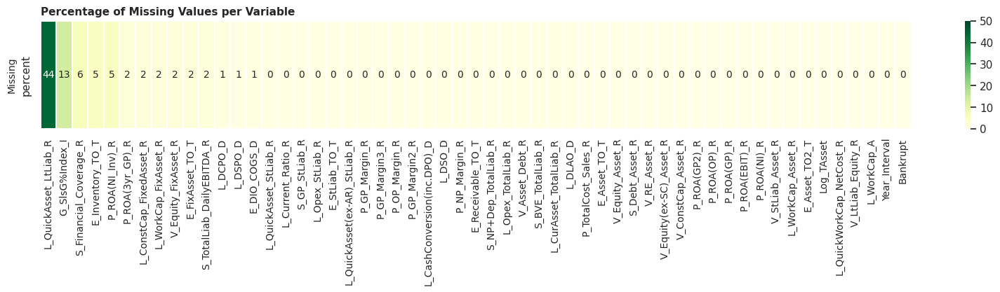

In [ ]:
#Variables with missing values
miss_columns=conso.stb.missing()
miss_columns = miss_columns.iloc[:,2:3]
sns.set(style='white')

high_miss = miss_columns.transpose()
x=high_miss.columns
fig, ax = plt.subplots(figsize=[20,2])
sns.heatmap(data=high_miss,cmap='YlGn', annot=True, annot_kws={'size': 10} ,fmt='.0f', vmin=0, vmax=50, linewidths=0.1)
ax.set_ylabel('Missing',size=10)
ax.set_xticklabels(x,size=10)
plt.title('Percentage of Missing Values per Variable',fontsize=11, weight='bold', loc='left')
#plt.savefig('missing_pct.png')

print("Count of variables with missing values:",((miss_columns[(miss_columns['percent'] >0)]).count().sum().round(2)))
print("Count variables with atleast 1% of values are missing:",((miss_columns[(miss_columns['percent'] >1)]).count().sum().round(2)))

* There are 53 variables with missing values, 11 of them have 1% or more missing. To understand the nature of missing data and determine the appropriate approach to handle it, a summary of zero frequencies was also extracted to see patterns given that financial ratios were derived from interrelated accounting items.

Count variables with zero values: 49
Count variables with atleast 1% of values are zero: 7


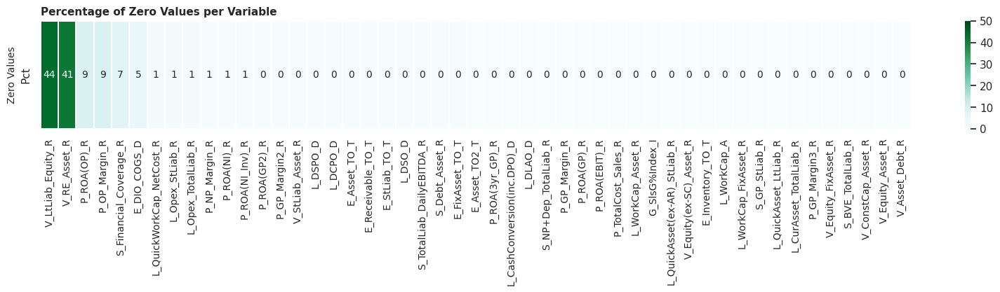

In [ ]:
#Variables with zero values
zero_counts = conso.iloc[:,1:].agg(lambda x: x.eq(0).sum())
zero_counts=pd.DataFrame({"Zero_Count":zero_counts,
                          "Pct":((zero_counts/len(conso))*100).round(2)})
zero = zero_counts.iloc[:,1:2].sort_values(by='Pct',ascending=False)
sns.set(style='dark')


high_zero = zero[(zero['Pct'] >0)].transpose()
x=high_zero.columns
fig, ax = plt.subplots(figsize=[20,2])
sns.heatmap(data=high_zero,cmap='BuGn', annot=True, fmt='.0f',annot_kws={'size': 10}, vmin=0, vmax=50,linewidths=0.1)
plt.title('Percentage of Zero Values per Variable',fontsize=11, weight='bold', loc='left')
ax.set_xticklabels(x,size=10)
ax.set_ylabel('Zero Values',size=10)
#plt.savefig('missing_pct.png')

print("Count variables with zero values:",(zero[(zero['Pct'] >0)]).count().sum().round(2))
print("Count variables with atleast 1% of values are zero:",(zero[(zero['Pct'] >=1)]).count().sum().round(2))

* Variables with highest number of missing and zero values, it was found out that ‘L_QuickAsset_LtLiab_R’ and ‘V_LtLiab_Equity_R’, are both related to Long-term Liability. It is possible that companies had no outstanding long-term liabilities in the reporting year resulting to zero long-term liability to equity ratio; and reason for null quick asset/long-term liability ratio

**Handling Missing Values**:

In [ ]:
#Save cleaned data as another dataframe
conso_cleaned=conso

In [ ]:
#Created variables with binary flags (1(Yes), 0(No))-- Related to variables with atleast 1% missing

conso_cleaned['NoLtLiab'] = conso_cleaned.apply(lambda row: 1 if pd.isnull(row['L_QuickAsset_LtLiab_R']) else 0, axis=1)
conso_cleaned['NoPrevYrSales'] = conso_cleaned.apply(lambda row: 1 if pd.isnull(row['G_SlsG%Index_I']) else 0, axis=1)
conso_cleaned['NoFinEx'] = conso_cleaned.apply(lambda row: 1 if pd.isnull(row['S_Financial_Coverage_R']) else 0, axis=1)
conso_cleaned['NoInventory'] = conso_cleaned.apply(lambda row: 1 if pd.isnull(row['E_Inventory_TO_T']) and pd.isnull(row['P_ROA(NI_Inv)_R']) else 0, axis=1)
conso_cleaned['No3yrAsset'] = conso_cleaned.apply(lambda row: 1 if pd.isnull(row['P_ROA(3yr_GP)_R']) else 0, axis=1)
conso_cleaned['NoFixedAsset'] = conso_cleaned.apply(lambda row: 1 if pd.isnull(row['E_FixAsset_TO_T']) and pd.isnull(row['L_WorkCap_FixAsset_R'])
                                                       and pd.isnull(row['L_ConstCap_FixedAsset_R']) and pd.isnull(row['V_Equity_FixAsset_R']) else 0, axis=1)

conso_cleaned['NoEBITDA'] = conso_cleaned.apply(lambda row: 1 if pd.isnull(row['S_TotalLiab_DailyEBITDA_R']) else 0, axis=1)
conso_cleaned['NoCOGS'] = conso_cleaned.apply(lambda row: 1 if pd.isnull(row['L_DCPO_D']) and pd.isnull(row['L_DSPO_D'])
                                                      and pd.isnull(row['E_DIO_COGS_D']) else 0, axis=1)


conso_cleaned.head()

,Bankrupt,Year_Interval,Log_TAsset,E_Asset_TO_T,E_Asset_TO2_T,E_Inventory_TO_T,E_Receivable_TO_T,E_StLiab_TO_T,E_FixAsset_TO_T,E_DIO_COGS_D,G_SlsG%Index_I,L_WorkCap_Asset_R,L_Current_Ratio_R,L_WorkCap_FixAsset_R,L_Opex_StLiab_R,L_Opex_TotalLiab_R,L_QuickAsset_LtLiab_R,L_QuickAsset(ex-AR)_StLiab_R,L_QuickAsset_StLiab_R,L_CurAsset_TotalLiab_R,L_ConstCap_FixedAsset_R,L_QuickWorkCap_NetCost_R,L_DLAO_D,L_DCPO_D,L_CashConversion(inc.DPO)_D,L_DSO_D,L_DSPO_D,L_WorkCap_A,P_ROA(NI)_R,P_ROA(EBIT)_R,P_ROA(GP)_R,P_GP_Margin_R,P_ROA(OP)_R,P_NP_Margin_R,P_ROA(3yr_GP)_R,P_ROA(GP2)_R,P_GP_Margin2_R,P_OP_Margin_R,P_ROA(NI_Inv)_R,P_GP_Margin3_R,P_TotalCost_Sales_R,S_Debt_Asset_R,S_BVE_TotalLiab_R,S_GP_StLiab_R,S_NP+Dep_TotalLiab_R,S_Financial_Coverage_R,S_TotalLiab_DailyEBITDA_R,V_RE_Asset_R,V_Equity_Asset_R,V_Asset_Debt_R,V_Equity(ex-SC)_Asset_R,V_ConstCap_Asset_R,V_StLiab_Asset_R,V_Equity_FixAsset_R,V_LtLiab_Equity_R,NoLtLiab,NoPrevYrSales,NoFinEx,NoInventory,No3yrAsset,NoFixedAsset,NoEBITDA,NoCOGS
0,0,5,5.9443,1.1389,1.7410,8.4160,5.1372,4.4158,7.4277,49.394,1.2479,0.39641,2.0472,1.7615,3.8772,0.56393,593.2700,0.662950,1.52250,2.0420,2.2480,0.39718,32.3510,94.14,114.42,71.050,0.25792,348690.0,0.200550,0.249760,0.249760,0.149420,0.21402,0.119980,0.47706,0.21402,0.128040,0.128040,1.00970,0.121960,0.87804,0.37951,1.33050,0.65980,0.60411,1.45820,0.051402,0.38825,0.50494,2.6349,0.50494,0.50591,0.37854,2.2437,0.001924,0,0,0,0,0,0,0,0
1,0,5,3.6884,1.6996,1.6996,4.1486,3.2732,3.4000,60.9870,100.130,1.4293,0.47225,1.9447,16.9460,2.9876,2.98760,NaN,0.086422,1.12520,1.9447,17.8660,0.42002,14.7860,122.17,199.49,111.510,0.33472,2304.6,0.209120,0.258340,0.258340,0.152000,0.24806,0.123040,NaN,0.20616,0.121300,0.145950,0.51045,0.121300,0.85300,0.49988,0.99601,0.51680,0.43992,88.44400,0.064371,0.00000,0.49788,2.0005,0.39542,0.49788,0.49988,17.8660,0.000000,1,0,0,0,1,0,0,0
2,0,5,4.3749,1.3090,1.3090,4.9909,3.9510,2.7185,5.2078,96.372,1.4283,0.26713,1.5548,1.0627,2.0630,1.42740,2.3019,0.322020,1.01010,1.0758,2.0504,0.81774,-1.1523,176.93,165.51,92.381,0.48474,6332.7,0.248660,0.309060,0.309060,0.236100,0.30260,0.189960,NaN,0.31565,0.241140,0.231170,0.94807,0.241140,0.76599,0.69592,0.43695,0.64184,0.37282,86.01100,0.074020,0.00000,0.30408,1.4369,0.28932,0.51537,0.48152,1.2098,0.694840,0,0,0,0,1,0,0,0
3,0,5,4.6511,1.0571,1.3562,4.5746,3.6147,4.2228,5.5497,84.344,1.5069,0.45879,2.4928,1.9618,3.9948,0.37581,NaN,0.401390,1.56960,2.4928,2.4524,0.14207,51.9520,91.37,180.77,100.980,0.25033,20545.0,0.081483,0.092704,0.092704,0.071428,0.11550,0.062782,0.17193,0.11550,0.088995,0.088995,0.28720,0.054015,0.94598,0.30734,1.86610,0.30163,0.36152,0.94076,0.069622,0.14988,0.57353,3.2537,0.57353,0.57353,0.30734,2.4524,0.000000,1,0,0,0,0,0,0,0
4,0,5,4.1424,1.1559,1.6278,6.3985,4.3158,2.8692,7.8980,65.936,NaN,0.22960,1.4063,1.1184,2.4823,0.32340,11.2470,0.293040,0.95787,1.2959,2.1184,0.48431,-7.3128,147.04,141.62,84.574,0.40285,3186.6,0.187320,0.187320,0.187320,0.115530,0.19832,0.115530,0.18732,0.19832,0.122310,0.122310,0.73919,0.134850,0.86515,0.61323,0.63070,0.33147,0.32211,1.41380,0.096680,0.18732,0.38677,1.6307,0.38677,0.43489,0.56511,1.8839,0.124440,0,1,0,0,0,0,0,0


* Additional 8 variables in the form of binary flags (0 and 1) were added to account for the information that these zero denominator items might entail, which can be non-outstanding or absence of the following: Long-term liability , Comparative previous year sale, Financial expenses incurred, Inventory, Incomplete 3year GP, Fixed asset, EBITDA, and Cost of Sales.

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipykernel_51291/1150231544.py:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.index,size=10,rotation="vertical")


Text(0.5, 0, '')

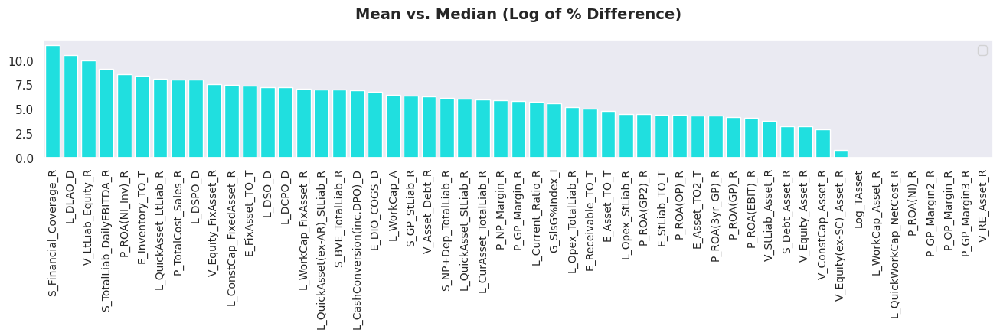

In [ ]:
#Comparison of Mean vs Median Values

medmean=pd.DataFrame({"Mean":conso_cleaned.iloc[:, np.r_[2:3,3:55]].mean().round(2),
                    "Median":conso_cleaned.iloc[:, np.r_[2:3,3:55]].median().round(2),
                    "Pct Diff to Median":np.log(((conso_cleaned.iloc[:, np.r_[2:3,3:55]].mean()-conso_cleaned.iloc[:, np.r_[2:3,3:55]].median())/(conso_cleaned.iloc[:, np.r_[2:3,3:55]].median())*100).round(2))})
medmean=medmean.sort_values(by="Pct Diff to Median",ascending=False)
df=medmean.iloc[:,2:3]

plt.figure(figsize=(16, 2))
plt.legend("")

#colors = ["red" if c < 0 else "green" for c in df['Pct Diff to Median']]
ax = sns.barplot(x=df.index,y=df['Pct Diff to Median'], color="cyan")
ax.set_ylabel('',fontsize=12)
plt.title('Mean vs. Median (Log of % Difference)',fontsize=14, weight='bold',pad=20)
ax.set_xticklabels(df.index,size=10,rotation="vertical")
ax.set_xlabel('',size=4)

#plt.savefig('med_mean.png')

* A comparison between mean and median values was conducted to determine the appropriate imputation technique to use.
* The mean cannot be used due to the influence of extreme values; hence, missing values were imputed using **median**.

In [ ]:
#Impute Using Median
conso_cleaned=conso_cleaned.fillna(conso_cleaned.median(numeric_only=True))

conso_cleaned.head()

,Bankrupt,Year_Interval,Log_TAsset,E_Asset_TO_T,E_Asset_TO2_T,E_Inventory_TO_T,E_Receivable_TO_T,E_StLiab_TO_T,E_FixAsset_TO_T,E_DIO_COGS_D,G_SlsG%Index_I,L_WorkCap_Asset_R,L_Current_Ratio_R,L_WorkCap_FixAsset_R,L_Opex_StLiab_R,L_Opex_TotalLiab_R,L_QuickAsset_LtLiab_R,L_QuickAsset(ex-AR)_StLiab_R,L_QuickAsset_StLiab_R,L_CurAsset_TotalLiab_R,L_ConstCap_FixedAsset_R,L_QuickWorkCap_NetCost_R,L_DLAO_D,L_DCPO_D,L_CashConversion(inc.DPO)_D,L_DSO_D,L_DSPO_D,L_WorkCap_A,P_ROA(NI)_R,P_ROA(EBIT)_R,P_ROA(GP)_R,P_GP_Margin_R,P_ROA(OP)_R,P_NP_Margin_R,P_ROA(3yr_GP)_R,P_ROA(GP2)_R,P_GP_Margin2_R,P_OP_Margin_R,P_ROA(NI_Inv)_R,P_GP_Margin3_R,P_TotalCost_Sales_R,S_Debt_Asset_R,S_BVE_TotalLiab_R,S_GP_StLiab_R,S_NP+Dep_TotalLiab_R,S_Financial_Coverage_R,S_TotalLiab_DailyEBITDA_R,V_RE_Asset_R,V_Equity_Asset_R,V_Asset_Debt_R,V_Equity(ex-SC)_Asset_R,V_ConstCap_Asset_R,V_StLiab_Asset_R,V_Equity_FixAsset_R,V_LtLiab_Equity_R,NoLtLiab,NoPrevYrSales,NoFinEx,NoInventory,No3yrAsset,NoFixedAsset,NoEBITDA,NoCOGS
0,0,5,5.9443,1.1389,1.7410,8.4160,5.1372,4.4158,7.4277,49.394,1.2479,0.39641,2.0472,1.7615,3.8772,0.56393,593.2700,0.662950,1.52250,2.0420,2.2480,0.39718,32.3510,94.14,114.42,71.050,0.25792,348690.0,0.200550,0.249760,0.249760,0.149420,0.21402,0.119980,0.47706,0.21402,0.128040,0.128040,1.00970,0.121960,0.87804,0.37951,1.33050,0.65980,0.60411,1.45820,0.051402,0.38825,0.50494,2.6349,0.50494,0.50591,0.37854,2.2437,0.001924,0,0,0,0,0,0,0,0
1,0,5,3.6884,1.6996,1.6996,4.1486,3.2732,3.4000,60.9870,100.130,1.4293,0.47225,1.9447,16.9460,2.9876,2.98760,3.0963,0.086422,1.12520,1.9447,17.8660,0.42002,14.7860,122.17,199.49,111.510,0.33472,2304.6,0.209120,0.258340,0.258340,0.152000,0.24806,0.123040,0.15510,0.20616,0.121300,0.145950,0.51045,0.121300,0.85300,0.49988,0.99601,0.51680,0.43992,88.44400,0.064371,0.00000,0.49788,2.0005,0.39542,0.49788,0.49988,17.8660,0.000000,1,0,0,0,1,0,0,0
2,0,5,4.3749,1.3090,1.3090,4.9909,3.9510,2.7185,5.2078,96.372,1.4283,0.26713,1.5548,1.0627,2.0630,1.42740,2.3019,0.322020,1.01010,1.0758,2.0504,0.81774,-1.1523,176.93,165.51,92.381,0.48474,6332.7,0.248660,0.309060,0.309060,0.236100,0.30260,0.189960,0.15510,0.31565,0.241140,0.231170,0.94807,0.241140,0.76599,0.69592,0.43695,0.64184,0.37282,86.01100,0.074020,0.00000,0.30408,1.4369,0.28932,0.51537,0.48152,1.2098,0.694840,0,0,0,0,1,0,0,0
3,0,5,4.6511,1.0571,1.3562,4.5746,3.6147,4.2228,5.5497,84.344,1.5069,0.45879,2.4928,1.9618,3.9948,0.37581,3.0963,0.401390,1.56960,2.4928,2.4524,0.14207,51.9520,91.37,180.77,100.980,0.25033,20545.0,0.081483,0.092704,0.092704,0.071428,0.11550,0.062782,0.17193,0.11550,0.088995,0.088995,0.28720,0.054015,0.94598,0.30734,1.86610,0.30163,0.36152,0.94076,0.069622,0.14988,0.57353,3.2537,0.57353,0.57353,0.30734,2.4524,0.000000,1,0,0,0,0,0,0,0
4,0,5,4.1424,1.1559,1.6278,6.3985,4.3158,2.8692,7.8980,65.936,1.0452,0.22960,1.4063,1.1184,2.4823,0.32340,11.2470,0.293040,0.95787,1.2959,2.1184,0.48431,-7.3128,147.04,141.62,84.574,0.40285,3186.6,0.187320,0.187320,0.187320,0.115530,0.19832,0.115530,0.18732,0.19832,0.122310,0.122310,0.73919,0.134850,0.86515,0.61323,0.63070,0.33147,0.32211,1.41380,0.096680,0.18732,0.38677,1.6307,0.38677,0.43489,0.56511,1.8839,0.124440,0,1,0,0,0,0,0,0


### c. Data Distribution

**c.1 Target Variable**

In [ ]:
#Distribution of Companies per Status
compstat=conso_cleaned.stb.freq(['Bankrupt']).round(2)
compstat.iloc[:,0:3]

,Bankrupt,count,percent
0,0,41314,95.18
1,1,2091,4.82


In [ ]:
#Distribution of Companies per Status per Year
compstat=conso_cleaned[conso_cleaned['Bankrupt']==1].stb.freq(['Year_Interval']).round(2)
compstat.iloc[:,0:3]

,Year_Interval,count,percent
0,2,515,24.63
1,3,495,23.67
2,1,410,19.61
3,4,400,19.13
4,5,271,12.96


(0.0, 100.0)

<Figure size 640x480 with 0 Axes>

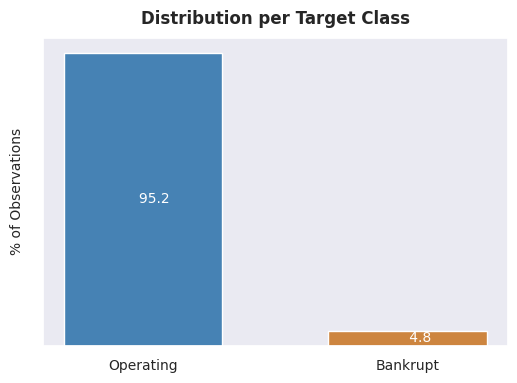

In [ ]:
#Data Distribution of Bankrupt and Operating Companies

company_status=((conso_cleaned.groupby(conso_cleaned.Bankrupt)['Year_Interval'].count()/len(conso))*100)
x_labels=['Operating','Bankrupt']
plt.subplots_adjust(top=2)

fig, ax = plt.subplots(figsize=[6,4])
ct = ax.bar(company_status.index,company_status,color=['steelblue','peru'],width=0.6)
ax.bar_label(container=ct,fmt='%9.1f',size=10,label_type='center',color="white")
ax.set_xlabel("",size=10)
ax.set_ylabel('% of Observations',size=10)
ax.set_xticks([0,1])
plt.title('Distribution per Target Class',size=12,weight="bold",pad=10)
ax.set_xticklabels(x_labels,size=10)
ax.set(yticklabels=[])
ax.set_ylim([0,100])

* The data is highly imbalanced with ~95%-5% proportion of operating vs. bankrupt firms.

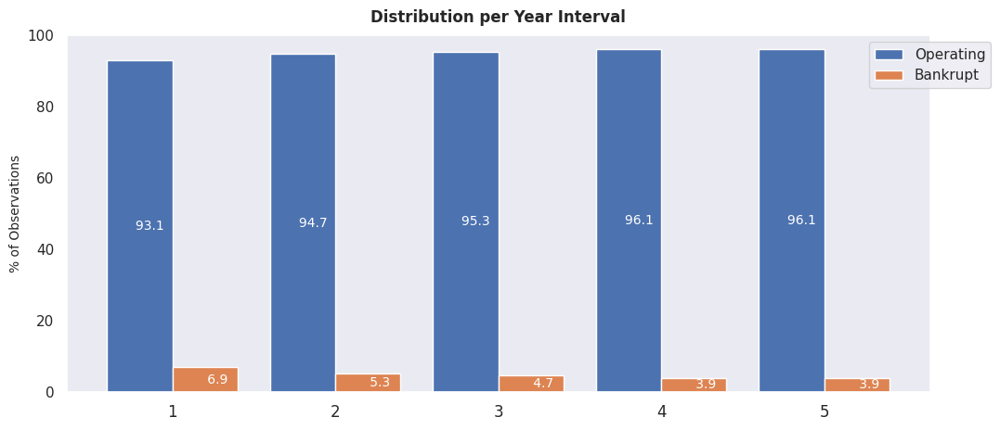

<Figure size 640x400 with 0 Axes>

In [ ]:
#Distribution of Companies per Year

#Subset based on Status
bankrupt = conso_cleaned[(conso_cleaned['Bankrupt'] == 1)].groupby(['Year_Interval'])['Bankrupt'].count()
operating = conso_cleaned[(conso_cleaned['Bankrupt'] == 0)].groupby(['Year_Interval'])['Bankrupt'].count()


stat_year = pd.DataFrame({'Operating': (operating/(bankrupt+operating))*100,
                          'Bankrupt': (bankrupt/(bankrupt+operating))*100}).reset_index()
xlabels=['1','2','3','4','5']

#set seaborn plotting aesthetics
sns.set(style='dark')

#create grouped bar chart
ax = stat_year.plot(kind='bar', x='Year_Interval',figsize=[12,5], width=0.8)
ax.set_xticklabels(xlabels,size=10)
ax.set_ylabel('% of Observations',size=10)
ax.set_xlabel("")
plt.title('Distribution per Year Interval',size=12,weight="bold", pad=10)
ax.set_xticklabels(xlabels,size=12,rotation="horizontal")
plt.figure().set_figheight(4)

ax.set_ylim([0,100])
for bars in ax.containers: ax.bar_label(bars, fmt='%9.1f',size=10,label_type='center',color="white")
ax.legend(loc='upper center',bbox_to_anchor=(1, 1))
plt.subplots_adjust(hspace = 2)

* The data proportion is approximately the same across all years. A higher proportion of bankrupt firms is found in the financial reporting period closer to the status year.

**c.2 Input Variables**

To get a general idea on the overall data distribution, a summary of skewness was generated.

/tmp/ipykernel_51291/2729030855.py:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.index,size=10,rotation="vertical")


45 Variables are Positively Skewed
7 Variables are Negatively Skewed


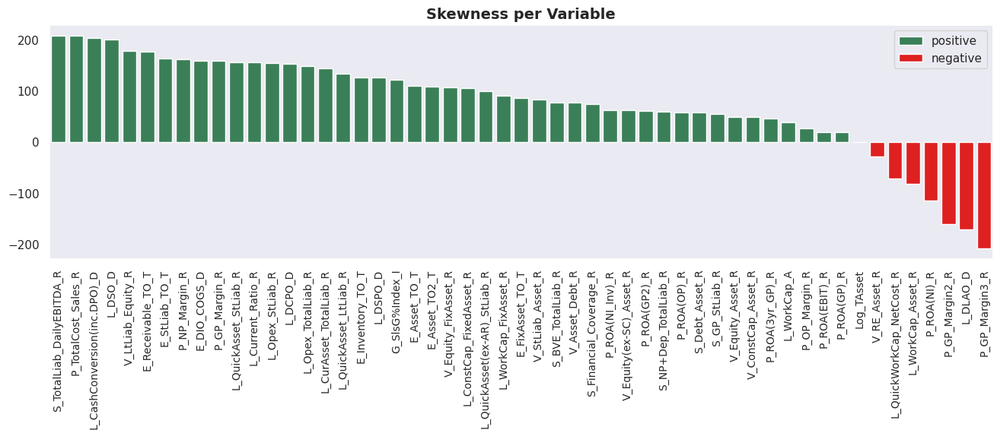

In [ ]:
#Create Subsets of Data for Negatively and Positively Skewed Data

skew=pd.DataFrame(conso_cleaned.iloc[:,2:55].skew().round(2))
skew.columns=['Skewness']
#skew.sort_values(by="Skewness", ascending=False)

df=(skew.sort_values(by='Skewness',ascending=False))
plt.figure(figsize=(16, 4))
plt.legend("")

colors = ["positive" if c > 0 else "negative" for c in df['Skewness']]
ax = sns.barplot(x=df.index,y=df['Skewness'], hue=colors,palette=['seagreen', 'red'])
ax.set_ylabel('',fontsize=12)
plt.title('Skewness per Variable',fontsize=14, weight='bold')
ax.set_xticklabels(df.index,size=10,rotation="vertical")
ax.set_xlabel('',size=10)

print((len(df[(df['Skewness']>  1)])),"Variables are Positively Skewed" )
print((len(df[(df['Skewness']< -1)])),"Variables are Negatively Skewed" )

plt.subplots_adjust(hspace = 2)

* The data distribution is highly skewed overall, ranging from -200 to 200 which significantly deviate from -1 to 1 cut-off. 45 positively skewed while 7 are negatively skewed

In [ ]:
#Summary of Skewness per Class
opskew=pd.DataFrame({"Operating":(conso_cleaned.iloc[:,0:55][(conso_cleaned.iloc[:,0:55]['Bankrupt']==0)].skew().round(2))})
bskew=pd.DataFrame({"Bankrupt":(conso_cleaned.iloc[:,0:55][(conso_cleaned.iloc[:,0:55]['Bankrupt']==1)].skew().round(2))})
conskew=pd.concat([opskew,bskew],axis=1)

Skewness Summary per Target Class

/tmp/ipykernel_51291/3688335188.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.index,size=10,rotation="vertical")


46 Variables are Positively Skewed
6 Variables are Negatively Skewed


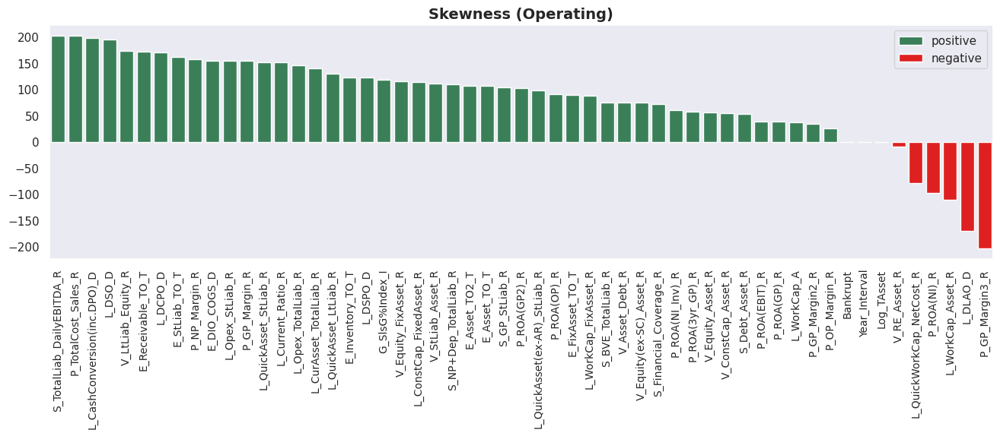

In [ ]:
# Operating Firms Skewness Summary

df=(opskew.sort_values(by="Operating",ascending=False))
plt.figure(figsize=(16, 4))
plt.legend("")

colors = ["positive" if c > 0 else "negative" for c in df['Operating']]
ax = sns.barplot(x=df.index,y=df['Operating'], hue=colors,palette=['seagreen', 'red'])
ax.set_ylabel('',fontsize=12)
plt.title('Skewness (Operating)',fontsize=14, weight='bold')
ax.set_xticklabels(df.index,size=10,rotation="vertical")
ax.set_xlabel('',size=10)

print((len(df[(df['Operating']>  1)])),"Variables are Positively Skewed" )
print((len(df[(df['Operating']< -1)])),"Variables are Negatively Skewed" )

plt.subplots_adjust(hspace = 2)

/tmp/ipykernel_51291/511622217.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.index,size=10,rotation="vertical")


34 Variables are Positively Skewed
18 Variables are Negatively Skewed


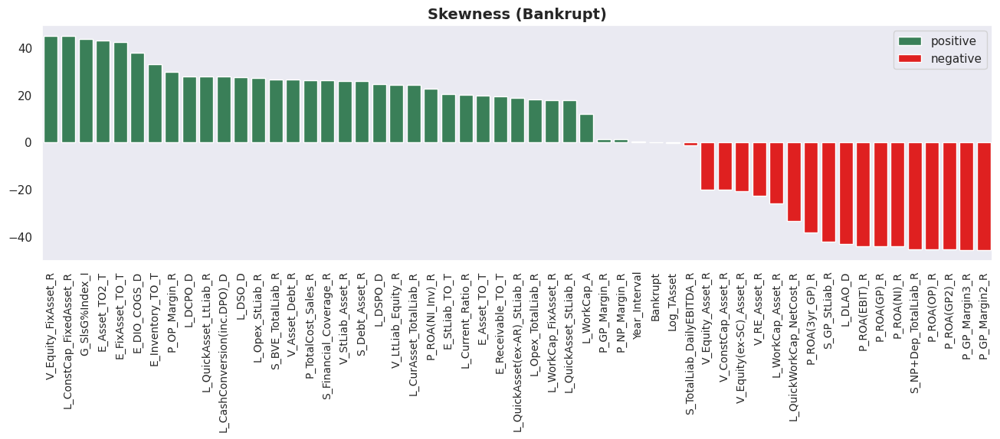

In [ ]:
#Skewness Summary of Bankrupt Firms

df=(bskew.sort_values(by="Bankrupt",ascending=False))
plt.figure(figsize=(16, 4))
plt.legend("")

colors = ["positive" if c > 0 else "negative" for c in df['Bankrupt']]
ax = sns.barplot(x=df.index,y=df['Bankrupt'], hue=colors,palette=['seagreen', 'red'])
ax.set_ylabel('',fontsize=12)
plt.title('Skewness (Bankrupt)',fontsize=14, weight='bold')
ax.set_xticklabels(df.index,size=10,rotation="vertical")
ax.set_xlabel('',size=10)

print((len(df[(df['Bankrupt']>  1)])),"Variables are Positively Skewed" )
print((len(df[(df['Bankrupt']< -1)])),"Variables are Negatively Skewed" )

plt.subplots_adjust(hspace = 2)

* When comparing the target classes, the majority of operating firms’ financial ratios is positively skewed, whereas bankrupt firms are negatively skewed.

### Comparison of variable distribution through histograms

Entire Distribution

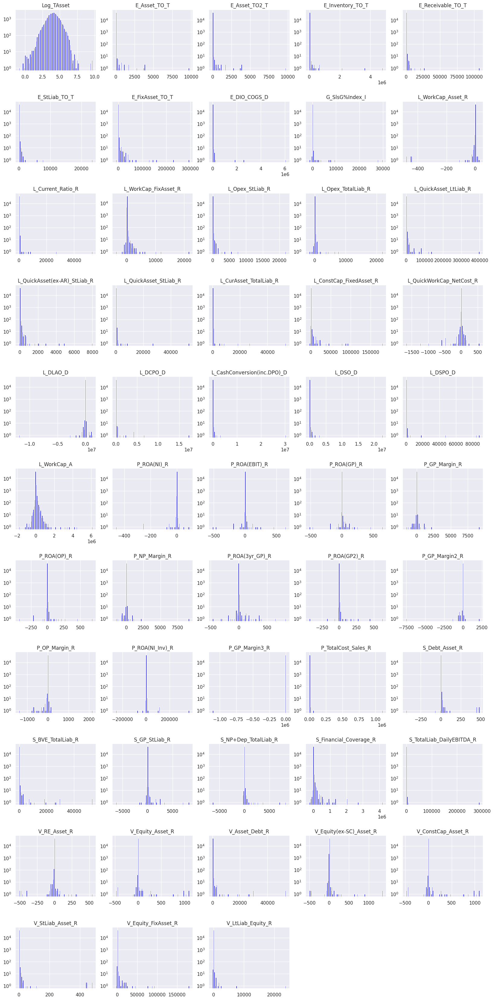

In [ ]:
## Distribution Entire Dataset

data=conso_cleaned.iloc[:, np.r_[0:0, 2:55]]

sns.set_style('darkgrid')
plt.figure(figsize=(20, 50))
#plt.suptitle('Efficiency',weight="bold",fontsize=16,y=1)

for i, col in enumerate(data.columns, start=1):
    plt.subplot(13, 5, i)
    plt.hist(data[col], bins=100, log=True,color="blue")
    plt.title(col)
    plt.subplots_adjust(wspace=0.2, hspace=0.5)
plt.show()

Per Target Class

i. Operating Firms

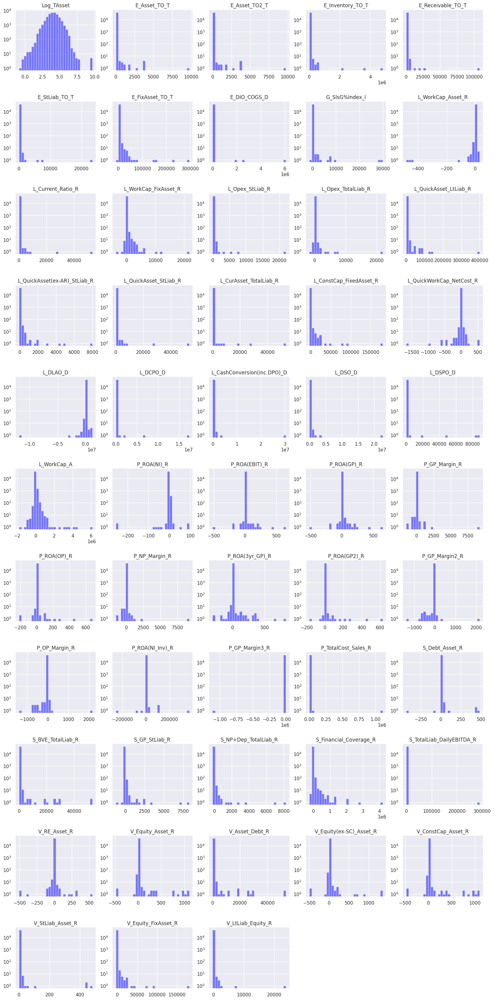

In [ ]:
# Data Distribution for Operating Firms

data=conso_cleaned.iloc[:, np.r_[0:1, 2:55]]

# Plotting
plt.figure(figsize=(20, 50))

# Plot histogram for each class

for class_label in data['Bankrupt'].unique():
    subset = data[data['Bankrupt'] == 0]


for i, col in enumerate(data.iloc[:,1:].columns, start=1):
    plt.subplot(13, 5, i)
    plt.hist(subset[col], bins=30, alpha=0.5, label=class_label, log=True, color="blue")
    plt.title(col)
    plt.subplots_adjust(wspace=0.2, hspace=0.5)
plt.show()


ii. Bankrupt Firms

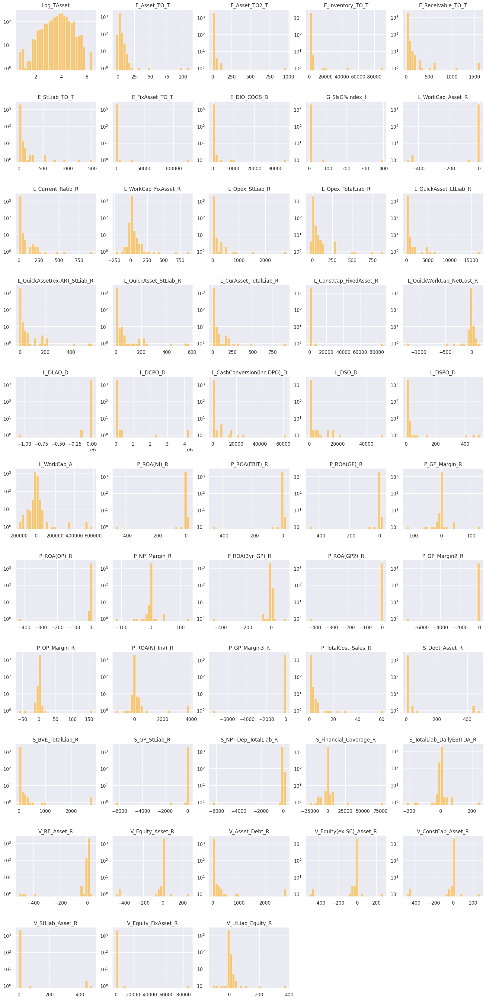

In [ ]:
data=conso_cleaned.iloc[:, np.r_[0:1, 2:55]]

# Plotting
plt.figure(figsize=(20, 50))

# Plot histogram for each class

for class_label in data['Bankrupt'].unique():
    subset = data[data['Bankrupt'] == 1]


for i, col in enumerate(data.iloc[:,1:].columns, start=1):
    plt.subplot(13, 5, i)
    plt.hist(subset[col], bins=30, alpha=0.5, label=class_label, log=True, color="orange")
    plt.title(col)
    plt.subplots_adjust(wspace=0.2, hspace=0.5)
plt.show()

**Key Points on Data Distribution**

1. Efficiency, Log, and Growth

 * Log_TAsset is the only normally distributed variable. The majority of bankrupt firms have log of asset between 2 and 6.
 * Distribution shape of efficiency ratios for both classes is fairly the same wherein all are positively skewed, unimodal, and commonly peaks nearly 0. There are also isolated bars that are extremely far from the center and appeared to be outliers.
 * However, operating firms have higher range of efficiency ratios compared to bankrupt firms
 *The two asset turnover ratios (E_Asset_TO_T and E_Asset_TO2_T) have identical distribution.

2. Liquidity
 * Distribution shape of Liquidity ratios for both classes is also fairly the same wherein Working Capital to Asset and Quick Working Capital to Net Cost (L_WorkCap _Asset, L_QuickWorkCap _Net Cost) appears to be negatively skewed indicating high current liabilities exceeding current assets.
 * The rest are positively skewed, unimodal, and commonly peaks nearly 0. There are also isolated bars that are extremely far from the center and appeared to be outliers.
 * Operating firms have higher range of liquidity ratios compared to bankrupt firms
 * Distribution shape for liquidity in days for both classes is fairly the same wherein Days in Liquid Asset Outstanding (L_DLAO_D) appears to be negatively skewed. Working Capital (L_WorkCap_A) is slightly normally distributed. The rest are positively skewed, and unimodal.

3. Profitability

  * The distribution shape of profitability ratios for operating firms are slightly normally distributed with data points and slight skew in both positive and negatives sides.
  * However, profitability ratios for bankrupt firms are almost negatively skewed especially those related to return on asset based on operating income (EBIT) and Gross Profit (GP)
  * Percentage of total cost to sales (P_TotalCost_Sales_R) is higher in bankrupt firms with (values >1), compared to operating firms (values <=0).

4. Leverage

  * Distribution shape of Retained Earnings to Asset (V_RE_Asset_R) for operating firms are slightly normally distributed with data points and slight skew in both positive and negatives sides. However, for bankrupt firms it is negatively skewed
  * Equity to Asset ratio ( V_Equity_Asset_R) is positively skewed  for operating firms and negatively skewed for bankrupt firms
  * Ranges of Asset to Debt ratio ( V_Asset_Debt_R) for operating firms are significantly higher than bankrupt firms
  * Ratios to asset, such as Equity (V_Equity (ex-SC) _Asset_R) and Constant Capital (V_ConstCap_Asset_R) are positively skewed for operating firms and negatively skewed for bankrupt firms.
  * For both classes, the distribution shape of Short-term Liability to Asset (V_StLiab_Asset_R) and Equity to Fixed Asset (V_Equity_FixAsset_R) are positively skewed and fairly the same.
  * Long-term Liability to Equity ratio ( V_LtLiab_Equity_R) is positively skewed  for operating firms and negatively skewed for bankrupt firm

5. Solvency

  * Range of Debt to Asset ratio (S_Debt_Asset_R) for bankrupt firms is higher than operating firms
  * Range of Book Value of Equity to Liability ratio (S_BVE_TotalLiab_R) for bankrupt firms is lower than operating firms
  * Gross Profit to Short-term Liability ratio (S_GP_StLiab_R) is heavy on the positive side for operating firms while negative for bankrupt firms.
  * EBITDA to Total Liability ratio (S_NP+Dep_TotalLiab_R) is positively skewed for operating firms and negatively skewed for bankrupt firms.
  * Financial Coverage ratio (S_Financial_Coverage_R) is heavy on the positive side for operating firms while negative for bankrupt firms.
  * Total Liability to Daily EBITDA ratio (S_TotalLiab_DailyEBITDA_R) is positively skewed for operating firms and negatively skewed for bankrupt firms.




### d. Outliers

The highly skewed distribution indicates presence of outliers. To examine the distribution of outliers per variable, the IQR method was used.

In [ ]:
# Number of Outliers per variable based on interquartile range

col=conso_cleaned.iloc[:,3:55]

q1 = col.quantile(0.25)
q3 = col.quantile(0.75)
iqr = q3-q1
lower = q1 - (1.5 * iqr)
upper = q3 + (1.5 * iqr)

outliers_sum= pd.DataFrame(((col < lower) | (col > upper)).sum())
outliers = pd.DataFrame({'lower_bound':lower.round(2),
                         'upper_bound':upper.round(2),
                         'max':col.max().round(2),
                         'min':col.min().round(2),
                         'outliers_count':outliers_sum[0],
                         'outliers_pct':((outliers_sum[0]/col.count())*100).round(2)})

outliers.sort_values(by="outliers_pct",ascending=False).head(10).round(3)

,lower_bound,upper_bound,max,min,outliers_count,outliers_pct
V_RE_Asset_R,-0.13,0.22,543.25,-508.41,11197,25.80
L_QuickAsset_LtLiab_R,0.31,6.11,398920.00,-525.52,9926,22.87
S_Financial_Coverage_R,-6.43,11.00,4208800.00,-259010.00,8985,20.70
P_ROA(NI_Inv)_R,-1.27,2.19,366030.00,-256230.00,7409,17.07
L_WorkCap_A,-7420.87,12441.64,6123700.00,-1805200.00,7354,16.94
S_TotalLiab_DailyEBITDA_R,-0.23,0.46,288770.00,-1234.40,7062,16.27
V_LtLiab_Equity_R,-0.35,0.59,23853.00,-327.97,6800,15.67
L_DLAO_D,-198.10,199.60,1250100.00,-11903000.00,6222,14.33
L_ConstCap_FixedAsset_R,-1.10,4.40,180440.00,-3828.90,6134,14.13
L_WorkCap_FixAsset_R,-2.07,3.58,21701.00,-3829.90,6110,14.08


Count variables with outliers: 52


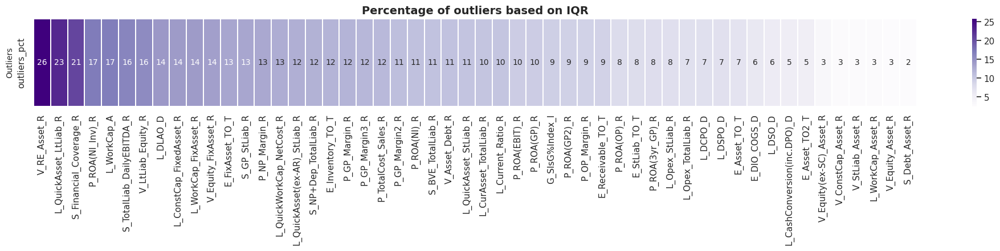

In [ ]:
#Variables with outliers

outliers_df=(outliers.sort_values(by='outliers_pct', ascending=False)).iloc[:,5:6].transpose()
x=outliers_df.columns
fig, ax = plt.subplots(figsize=[25,2])
sns.heatmap(data=outliers_df,cmap='Purples', annot=True, fmt='.0f',annot_kws={'size': 10},linewidths=0.1)
plt.title('Percentage of outliers based on IQR',fontsize=14, weight='bold')
ax.set_ylabel('Outliers',size=10)

#plt.savefig('missing_pct.png')

print("Count variables with outliers:",(len(outliers[(outliers['outliers_count'] >0)])))

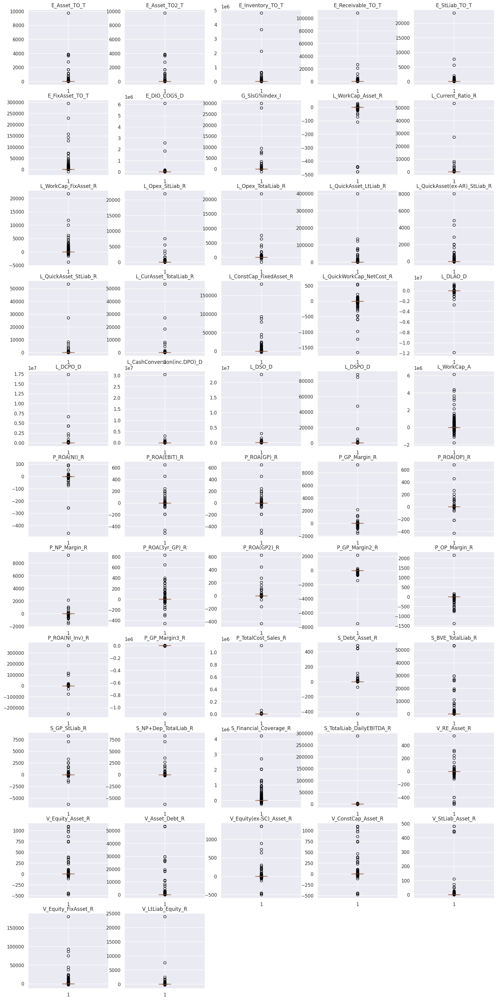

In [ ]:
# Boxplot to detect outliers

df=conso_cleaned.iloc[:,3:55]
plt.figure(figsize=(20, 50))

for i, col in enumerate(df.columns, start=1):
    plt.subplot(13, 5, i)
    plt.boxplot(df[col].dropna())
    plt.title(col)

plt.show()

**Key Points on Outliers**

* Based on IQR range criteria and shown in boxplot , there are outliers in most of the variables.
* 52 numerical variables have outliers, with “Retained Earnings to Asset”, “Quick Asset to Long-term Liability”, and “Financial Coverage Ratio” having the most with at least 20% of their values is outliers

**Handling Outliers**

In [ ]:
# Flag the variables with above 20% outliers
out=list(outliers.sort_values(by='outliers_pct', ascending=False).head(3).index)

for i in out:
  conso_cleaned[i+'_out']= conso_cleaned[i].apply(lambda x: 1 if x < outliers.loc[i,'lower_bound']
                                           or x > outliers.loc[i,'upper_bound'] else 0)

* Binary flags were first created to tag variables with atleast 20% outliers

In [ ]:
#Cap and Floor Outliers

feat=conso_cleaned.iloc[:,3:55]
for i in feat:
  conso_cleaned[i]= conso_cleaned[i].apply(lambda x: outliers.loc[i,'lower_bound'] if x < outliers.loc[i,'lower_bound']
                                           else outliers.loc[i,'upper_bound'] if x > outliers.loc[i,'upper_bound'] else x)

* Capping and floor then performed using the IQR method

/tmp/ipykernel_51291/4292200998.py:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.index,size=10,rotation="vertical")


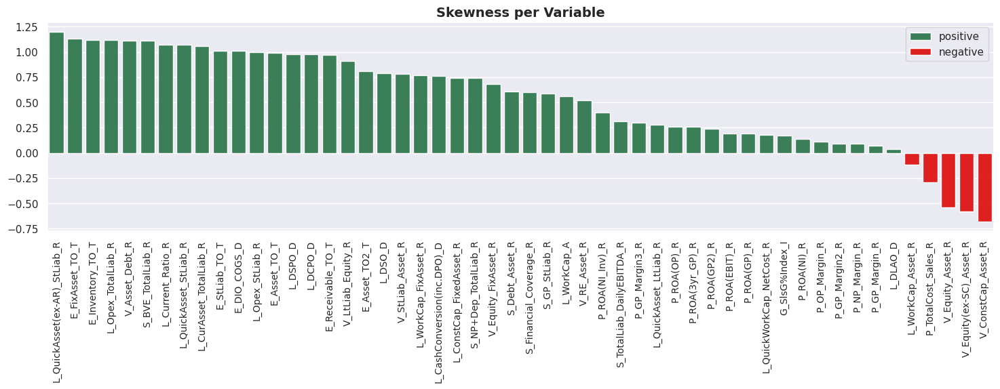

In [ ]:
#Skewness After Cap and Floor

skew=pd.DataFrame(conso_cleaned.iloc[:,3:55].skew().round(2))
skew.columns=['Skewness']
#skew.sort_values(by="Skewness", ascending=False)

df=(skew.sort_values(by='Skewness',ascending=False))
plt.figure(figsize=(18, 4))
plt.legend("")

colors = ["positive" if c > 0 else "negative" for c in df['Skewness']]
ax = sns.barplot(x=df.index,y=df['Skewness'], hue=colors,palette=['seagreen', 'red'])
ax.set_ylabel('',fontsize=12)
plt.title('Skewness per Variable',fontsize=14, weight='bold')
ax.set_xticklabels(df.index,size=10,rotation="vertical")
ax.set_xlabel('',size=10)



plt.subplots_adjust(hspace = 2)

* The Degree of skewness was reduced to nearly -1 to 1 after capping, log transformation is deemed not necessary

## Exploratory Data Analysis (EDA)

### a. Correlation

In [ ]:
#Correlation Matrix
corr=conso_cleaned.iloc[:,0:55].corr()

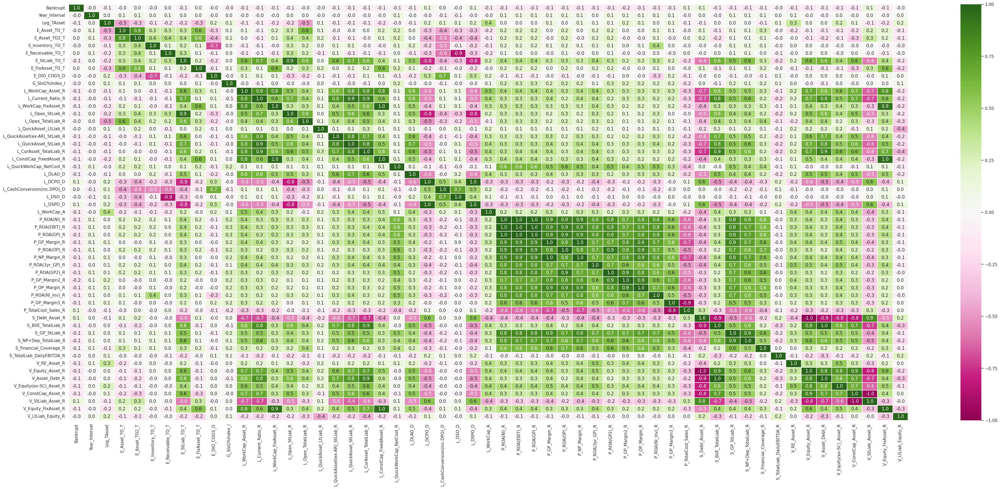

In [ ]:
#Heatmap
fig, axes = plt.subplots(figsize=(50, 20))
sns.heatmap(corr, cmap='PiYG', annot=True, fmt='.1f',vmin=-1,vmax=1,linewidths=0.005)
plt.show()

* As evident in correlation matrix, a high degree of multicollinearity exists among variables; particularly among liquidity, profitability, and solvency ratios.

* To gauge the severity of multicollinearity, Variance Inflation Factor (VFI) analysis was employed

In [ ]:
# Perform VIF to see how multicollinearity affect each variables

from statsmodels.stats.outliers_influence import variance_inflation_factor
vif_df=conso_cleaned.iloc[:,3:55].fillna(0) #Just for the purpose of IVF

# Calculate VIF for each feature
vif = pd.DataFrame()
vif["Feature"] = vif_df.columns
vif["VIF"] = [variance_inflation_factor(vif_df.values, i) for i in range(vif_df.shape[1])]

# Display VIF
print("\nVariance Inflation Factor (VIF):")
vif_sorted=(vif.sort_values(by="VIF", ascending=False))
vif_sorted.round(4)


Variance Inflation Factor (VIF):


,Feature,VIF
26,P_ROA(EBIT)_R,2487.5081
27,P_ROA(GP)_R,2271.3951
46,V_Asset_Debt_R,587.5084
37,P_TotalCost_Sales_R,490.3589
39,S_BVE_TotalLiab_R,364.5491
45,V_Equity_Asset_R,276.3025
23,L_DSPO_D,253.9510
20,L_DCPO_D,249.6997
48,V_ConstCap_Asset_R,241.8870
38,S_Debt_Asset_R,234.7817


Text(278.75, 0.5, '')

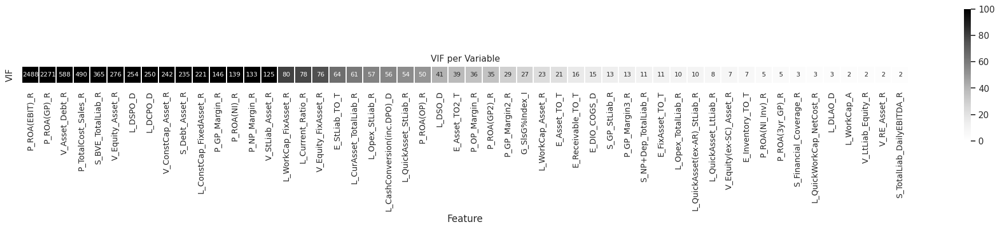

In [ ]:
#VIF
vifd=vif_sorted.set_index("Feature").transpose()
x=vifd.columns
fig, ax = plt.subplots(figsize=[25,3])

sns.heatmap(data=vifd,cmap='Greys',annot=True, fmt='.0f',annot_kws={'size': 8},vmin=0, vmax=100,linewidths=0.1, square=True) # 1 to 10 is VIF Scale
plt.title('VIF per Variable',fontsize=11, loc='center')
ax.set_xticklabels(x,size=10)
ax.set_ylabel('',size=10)
#plt.savefig('missing_pct.png')

* Based on the results of VIF analysis, majority of variables have VFI score above 10, indicating severe degree of multicollinearity

In [ ]:
#Remove Highly Correlated Variables

conso_cleaned=conso_cleaned.drop(columns=['E_Asset_TO_T','E_StLiab_TO_T','L_Current_Ratio_R','L_WorkCap_FixAsset_R','L_Opex_StLiab_R',
                                          'L_QuickAsset_StLiab_R','L_CurAsset_TotalLiab_R','L_ConstCap_FixedAsset_R','L_DSO_D','L_DSPO_D',
                                          'P_ROA(NI)_R','P_ROA(EBIT)_R','P_ROA(GP)_R','P_GP_Margin_R','P_ROA(OP)_R','P_NP_Margin_R',
                                          'P_ROA(3yr_GP)_R','P_ROA(GP2)_R','P_OP_Margin_R','P_ROA(NI_Inv)_R','P_TotalCost_Sales_R',
                                          'S_BVE_TotalLiab_R','S_Debt_Asset_R','S_GP_StLiab_R','S_NP+Dep_TotalLiab_R','V_Equity_Asset_R',
                                          'V_Asset_Debt_R','V_StLiab_Asset_R','V_Equity_FixAsset_R'])

* Variables with correlation of <=-0.70 or >=0.70 were evaluated. Those with highest correlation with the target were retained and the rest was dropped.
* Total of 29 variables were dropped.

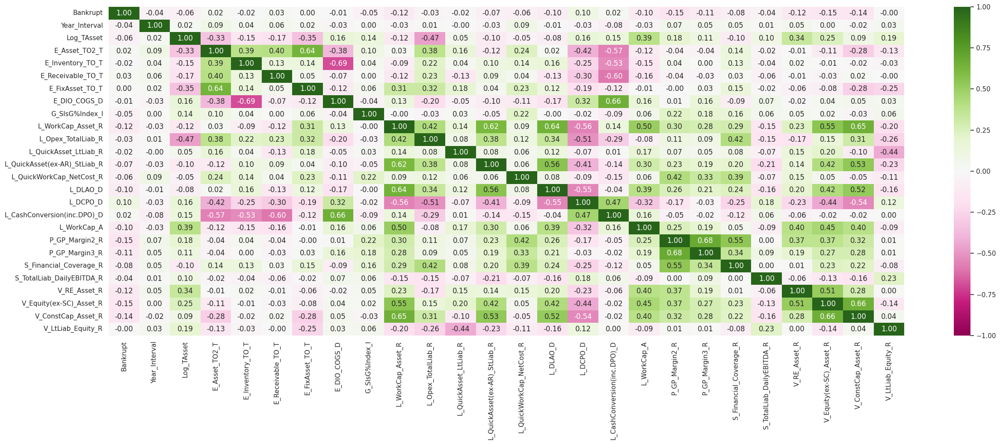

In [ ]:
#Heatmap
fig, axes = plt.subplots(figsize=(30, 10))
sns.heatmap(conso_cleaned.iloc[:,0:26].corr(), cmap='PiYG',vmin=-1,vmax=1, annot=True, fmt='.2f')
plt.show()

#plt.savefig('corr_latest.png')

In [ ]:
# Perform VIF to see how removal improved VIF

from statsmodels.stats.outliers_influence import variance_inflation_factor
vif_df=conso_cleaned.iloc[:,3:26].fillna(0) #Just for the purpose of IVF

# Calculate VIF for each feature
vif = pd.DataFrame()
vif["Feature"] = vif_df.columns
vif["VIF"] = [variance_inflation_factor(vif_df.values, i) for i in range(vif_df.shape[1])]

# Display VIF
print("\nVariance Inflation Factor (VIF):")
vif_sorted=(vif.sort_values(by="VIF", ascending=False))
vif_sorted.round(2)


Variance Inflation Factor (VIF):


,Feature,VIF
21,V_ConstCap_Asset_R,22.72
5,G_SlsG%Index_I,21.15
13,L_CashConversion(inc.DPO)_D,19.30
0,E_Asset_TO2_T,15.66
12,L_DCPO_D,11.73
6,L_WorkCap_Asset_R,9.30
4,E_DIO_COGS_D,9.01
2,E_Receivable_TO_T,8.60
3,E_FixAsset_TO_T,6.94
8,L_QuickAsset_LtLiab_R,6.32


* After removing highly correlated variables, VFI scores have improved with majority of variables reduced to below 10.

**Summary of Data Exploration**

* Distribution Patterns – There is notable difference with respect to profitability, leverage and solvency ratios. The majority of operating firms have positively skewed ratios, whereas bankrupt firms have negatively skewed ratios.

* Correlation – there is high degree of multicollinearity among variables. Despite removing highly correlated variables using 0.7 thresholds, some variables still have VIF scores above 10.


#---------------------------------------- **Data Preparation and Feature Engineering**----------------------------

### Feature Transformation

The “logarithm of total assets” was binned into discrete values to reduce dimensionality.

In [ ]:
#BIN Logarithm of Asset
labels=[1,2,3,4,5,6,7,8,9,10]
range=(pd.qcut(conso_cleaned['Log_TAsset'], q=10, labels=labels)).astype('int')
labels=list(np.unique(range))

conso_cleaned['Log_TAsset'] = (pd.qcut(conso_cleaned['Log_TAsset'], q=10, labels=labels)).astype('int')

In [ ]:
#Distribution of Companies per Status
compstat=conso_cleaned[conso_cleaned['Bankrupt']==1].stb.freq(['Log_TAsset']).round(2)
compstat.iloc[:,0:3].sort_values(by='Log_TAsset')

,Log_TAsset,count,percent
0,1,351,16.79
2,2,224,10.71
4,3,204,9.76
3,4,213,10.19
5,5,199,9.52
1,6,233,11.14
8,7,161,7.70
7,8,198,9.47
6,9,198,9.47
9,10,110,5.26


* Variables with correlation of  <=-0.70 or  >=0.70 were evaluated . Those with highest correlation with the target are retained and the rest were dropped. A total of 34 variables were removed.

### Data Partitioning

The cleaned dataset was partitioned into training and validation set using 60-40 split. Stratified train_test_split was employed to mitigate the impact of highly imbalanced data.  

In [ ]:
# Partition Dataset based on 60-40 split

X = conso_cleaned.iloc[:,1:]
y = conso_cleaned['Bankrupt']

train_X, valid_X, train_y, valid_y = train_test_split(X,y, test_size=0.4,stratify=y, random_state=1)

### Upsampling SMOTE

* After data partitioning, the train set was subjected to re-sampling
* To balance the data, oversampling was chosen over undersampling to avoid losing significant amount of information.  
* Synthetic Minority Over-sampling Technique (SMOTE) was employed in the training set. It works by generating synthetic data by randomly selecting k nearest neighbor of minority class.

In [ ]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state = 2)

train_Xsm, train_ysm = sm.fit_resample(train_X, train_y.ravel())

#------------------------Modeling base on Resampled Training Dataset (SMOTE)#---------------------

Considering the above findings in Data Exploration, decision tree models will be explored and utilized first to select the most important features. Tree-based algorithms are generally robust to multicollinearity and skewed data. Afterwards, logistic regression will be employed using the selected features.

* The evaluation to be used are:Precision, Recall, F1-score, Accuracy, ROC_AUC


## Decision Tree

### 1a. Basic Full Decision Tree

In [ ]:
# Build and Train Model

fullClassTree = DecisionTreeClassifier(random_state=1)
fullClassTree.fit(train_Xsm,train_ysm)

DecisionTreeClassifier(random_state=1)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.293761 to fit


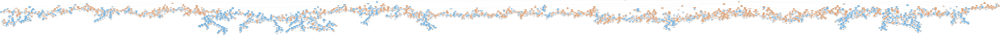

In [ ]:
plotDecisionTree(fullClassTree, feature_names=train_Xsm.columns)

In [ ]:
#Split Rule
rules = export_text(fullClassTree, feature_names=list(X.columns))
print(rules)

|--- V_RE_Asset_R <= -0.00
|   |--- V_RE_Asset_R <= -0.13
|   |   |--- L_WorkCap_Asset_R <= -0.19
|   |   |   |--- E_FixAsset_TO_T <= 20.57
|   |   |   |   |--- S_TotalLiab_DailyEBITDA_R <= 0.46
|   |   |   |   |   |--- L_QuickWorkCap_NetCost_R <= 0.69
|   |   |   |   |   |   |--- L_QuickWorkCap_NetCost_R <= -0.39
|   |   |   |   |   |   |   |--- Year_Interval <= 1.50
|   |   |   |   |   |   |   |   |--- G_SlsG%Index_I <= 1.07
|   |   |   |   |   |   |   |   |   |--- E_FixAsset_TO_T <= 4.22
|   |   |   |   |   |   |   |   |   |   |--- Log_TAsset <= 8.50
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 2
|   |   |   |   |   |   |   |   |   |   |--- Log_TAsset >  8.50
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 2
|   |   |   |   |   |   |   |   |   |--- E_FixAsset_TO_T >  4.22
|   |   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |   |--- G_SlsG%Index_I >  1.07
|   |   |   |   |   |   |   |   |   |--- L_

In [ ]:
# Evaluation with Accuracy and ROC_AUC

probs =fullClassTree.predict_proba(valid_X)
preds = probs[:, 1]
fpr, tpr, threshold = metrics.roc_curve(valid_y, preds)
roc_aucsft = metrics.auc(fpr, tpr)

#Classification Report
fulldecisiontree_predictions = fullClassTree.predict(valid_X)

# Assess The Model using Classification Summary

print("Train",classificationSummary(train_ysm,fullClassTree.predict(train_Xsm)))
print("   ")
print("Valid:", classificationSummary(valid_y,fullClassTree.predict(valid_X)))

print('\nClassification Report: Full Class Tree\n')
gridsearchtree=(classification_report(valid_y, fulldecisiontree_predictions , target_names=['Operating', 'Bankrupt'],output_dict=True))
print(classification_report(valid_y, fulldecisiontree_predictions , target_names=['Operating', 'Bankrupt']))

print('\nROC_AUC:\n', roc_aucsft.round(4))

Confusion Matrix (Accuracy 1.0000)

       Prediction
Actual     0     1
     0 24788     0
     1     0 24788
Train None
   
Confusion Matrix (Accuracy 0.8979)

       Prediction
Actual     0     1
     0 15206  1320
     1   453   383
Valid: None

Classification Report: Full Class Tree

              precision    recall  f1-score   support

   Operating       0.97      0.92      0.94     16526
    Bankrupt       0.22      0.46      0.30       836

    accuracy                           0.90     17362
   macro avg       0.60      0.69      0.62     17362
weighted avg       0.94      0.90      0.91     17362


ROC_AUC:
 0.6891


* The classification summary revealed that it is a fully-fit tree, for the training accuracy is at 100% while validation performance is only at 90%, an indication of overfitted model.

['V_RE_Asset_R', 'L_Opex_TotalLiab_R', 'S_Financial_Coverage_R', 'P_GP_Margin2_R']


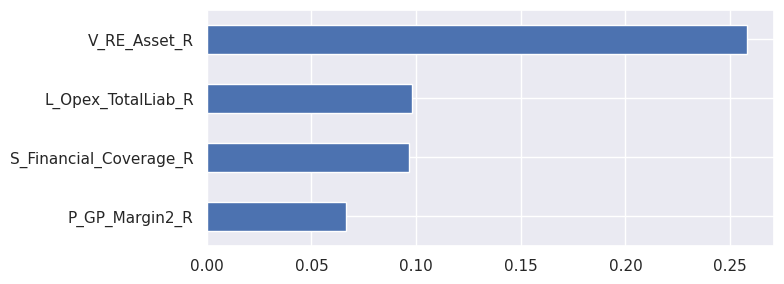

In [ ]:
# See what these variables are

fulltree_importances = fullClassTree.feature_importances_  # Store array as an object
threshold = 0.05

# Create a dataframe for importances and std
fulltree_featimp = pd.DataFrame({'feature': train_Xsm.columns, 'importance': fulltree_importances})
fulltree_featimp =fulltree_featimp[fulltree_featimp['importance']>=threshold]
fulltree_featimp  = fulltree_featimp .sort_values('importance') # Sort based on importance in asc order (default)
#print(df)

fulltree_feat=list(fulltree_featimp['feature'])
p=fulltree_featimp .sort_values('importance',ascending=False)
print(list(p['feature']))


ax = fulltree_featimp.plot(kind='barh', x='feature', legend=False,figsize=[8,3])
ax.set_ylabel('')

plt.tight_layout()
plt.show()

* The most important features for the full tree at .05 thresholds are: *Retained Earnings to Asset*, *Opex to Total Liabilities*, *Financial Coverage*, and *Gross Profit Margin*.

### 1b. GridClass Tree (GridSearch CV) - Hyper parameter Tuning

In [ ]:
#Setting parameters

param_grid = {'max_depth' : [2, 3, 5, 10, 12],
              'min_samples_split' : [0.07, 0.05, 0.01, 0.005,0.10,0.20],
              'min_impurity_decrease' : [0.05, 0.02, 0.01, 0.005, .001]}


In [ ]:
# Run grid search using decision tree classifier

gridsearch = GridSearchCV( DecisionTreeClassifier(random_state=1), param_grid, cv=5, n_jobs=-1 )

gridsearch.fit(train_Xsm, train_ysm)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=1), n_jobs=-1,
             param_grid={'max_depth': [2, 3, 5, 10, 12],
                         'min_impurity_decrease': [0.05, 0.02, 0.01, 0.005,
                                                   0.001],
                         'min_samples_split': [0.07, 0.05, 0.01, 0.005, 0.1,
                                               0.2]})

In [ ]:
#Print Best Score and Parameters

print("Best Score:", gridsearch.best_score_)
print("Best Parameters:",gridsearch.best_params_)

Best Score: 0.8493431013147859
Best Parameters: {'max_depth': 12, 'min_impurity_decrease': 0.001, 'min_samples_split': 0.005}


* An exhaustive grid search with cross validation was performed to identify the best set of parameters that leads to highest accuracy
* The best set of parameter selected by grid search is: 12 numbers of splits, at least 0.1% records per split, and at least 0.5% decrease in impurity to warrant further splits.

In [ ]:
#Fit the best parameters selected by CV to Decion Tree

gridClassTree = gridsearch.best_estimator_
gridClassTree.fit(train_Xsm, train_ysm)

DecisionTreeClassifier(max_depth=12, min_impurity_decrease=0.001,
                       min_samples_split=0.005, random_state=1)

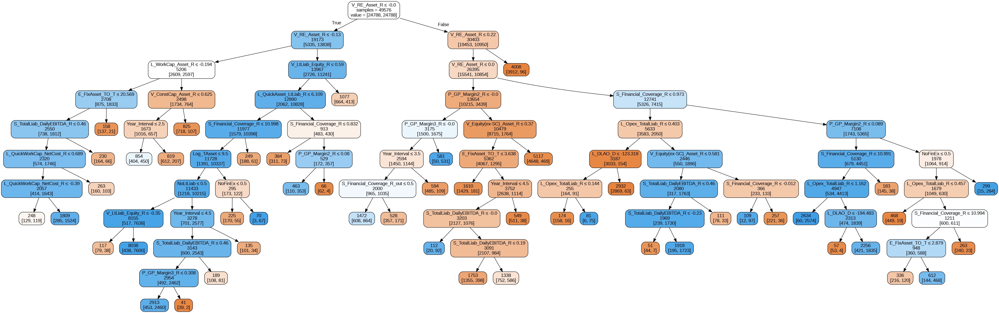

In [ ]:
# Plot the Grid Class Tree

plotDecisionTree(gridClassTree, feature_names=train_Xsm.columns)


* The grid search tree is less complex compared to the full decision tree, but still with significant number of repeating splits that makes it challenging to interpret.
* The best split is Retained Earnings to Asset at <= -0.0 threshold
* Interpretation of the Tuned Tree’s rules based on top split points:
  *	If the Retained Earnings to Asset is less than -0.13, Working Capital to Asset is below -0.19, Fixed Asset Turnover of less than 20.57, Total Liability per daily EBITDA is less than 0.46, and Quick Working Capital to Net Cost is between -0.39 and 0.69, then there is 84% chance of bankruptcy since out of 1,809 firms, 1524 were classified by the tree as bankrupt.




In [ ]:
#Split Rule
rules = export_text(gridClassTree, feature_names=list(X.columns))
print(rules)

|--- V_RE_Asset_R <= -0.00
|   |--- V_RE_Asset_R <= -0.13
|   |   |--- L_WorkCap_Asset_R <= -0.19
|   |   |   |--- E_FixAsset_TO_T <= 20.57
|   |   |   |   |--- S_TotalLiab_DailyEBITDA_R <= 0.46
|   |   |   |   |   |--- L_QuickWorkCap_NetCost_R <= 0.69
|   |   |   |   |   |   |--- L_QuickWorkCap_NetCost_R <= -0.39
|   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |--- L_QuickWorkCap_NetCost_R >  -0.39
|   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |--- L_QuickWorkCap_NetCost_R >  0.69
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |--- S_TotalLiab_DailyEBITDA_R >  0.46
|   |   |   |   |   |--- class: 0
|   |   |   |--- E_FixAsset_TO_T >  20.57
|   |   |   |   |--- class: 0
|   |   |--- L_WorkCap_Asset_R >  -0.19
|   |   |   |--- V_ConstCap_Asset_R <= 0.63
|   |   |   |   |--- Year_Interval <= 2.50
|   |   |   |   |   |--- class: 1
|   |   |   |   |--- Year_Interval >  2.50
|   |   |   |   |   |--- class: 0
|   |   |   |--- V_ConstCap_Asset_R >  0.6

In [ ]:
# Evaluation with Accuracy and ROC_AUC

probs = gridClassTree.predict_proba(valid_X)
preds = probs[:, 1]
fpr, tpr, threshold = metrics.roc_curve(valid_y, preds)
roc_aucgct = metrics.auc(fpr, tpr)

#Classification Summary
print("Train:", classificationSummary(train_y,gridClassTree.predict(train_X)))
print("")
print("Valid:",classificationSummary(valid_y,gridClassTree.predict(valid_X)))

#Classification Report
gsdecisiontree_predictions = gridClassTree.predict(valid_X)

print('\nClassification Report: Grid Class Tree\n')
gridsearchtree=(classification_report(valid_y, gsdecisiontree_predictions , target_names=['Operating', 'Bankrupt'],output_dict=True))
print(classification_report(valid_y, gsdecisiontree_predictions , target_names=['Operating', 'Bankrupt']))

print('\nROC_AUC:\n', roc_aucgct.round(4))

Confusion Matrix (Accuracy 0.8515)

       Prediction
Actual     0     1
     0 21564  3224
     1   643   612
Train: None

Confusion Matrix (Accuracy 0.8505)

       Prediction
Actual     0     1
     0 14386  2140
     1   456   380
Valid: None

Classification Report: Grid Class Tree

              precision    recall  f1-score   support

   Operating       0.97      0.87      0.92     16526
    Bankrupt       0.15      0.45      0.23       836

    accuracy                           0.85     17362
   macro avg       0.56      0.66      0.57     17362
weighted avg       0.93      0.85      0.88     17362


ROC_AUC:
 0.7871


* Grid class tree was less overfit and with higher ROC_AUC by .10 (0.79 vs. 0.69) compared to full class tree; however, with lower f1-score and overall accuracy by 0.07 and 0.5 respectively.

['P_GP_Margin2_R', 'S_Financial_Coverage_R', 'L_Opex_TotalLiab_R', 'V_RE_Asset_R']


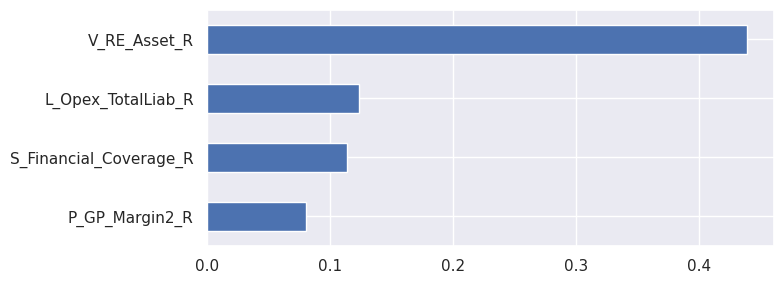

In [ ]:
# See what these variables are

gcimportances =  gridClassTree.feature_importances_  # Store array as an object
threshold = 0.05
gcselected_features = X.columns[gcimportances > threshold]


# Create a dataframe for importances and std
gctree_featimp = pd.DataFrame({'feature': gcselected_features, 'importance': gcimportances[gcimportances > threshold]})
gctreetree_featimp =gctree_featimp[gctree_featimp['importance']>=threshold]
gctree_featimp  = gctree_featimp .sort_values('importance') # Sort based on importance in asc order (default)
#print(df)

gctree_feat=list(gctree_featimp['feature'])
print(gctree_feat)

ax = gctree_featimp.plot(kind='barh', x='feature', legend=False,figsize=[8,3])
ax.set_ylabel('')

plt.tight_layout()
plt.show()

* The most important features for the gridclass tree at .05 thresholds are: *Retained Earnings to Asset*, *Opex to Total Liabilities*, *Financial Coverage*, and *Gross Profit Margin*. The same set of features determined by full tree


###1c. Random Forest

Reducing the complexity of the full tree through hyper parameter tuning did not improve model performance given the limitations of basic decision tree; hence,Random Forest was explored.

In [ ]:
#Define object for random forest classifier
rf = RandomForestClassifier(random_state=1, n_estimators=500)
# The default number of trees(n_estimator) is 100, here we do 500

rf.fit(train_Xsm, train_ysm)
#Fit in train dataset

RandomForestClassifier(n_estimators=500, random_state=1)

In [ ]:
import matplotlib.cm as cm
from matplotlib.colors import LinearSegmentedColormap, Normalize

In [ ]:
# Evaluation with Accuracy and ROC_AUC

probs = rf.predict_proba(valid_X)
preds = probs[:, 1]
fpr, tpr, threshold = metrics.roc_curve(valid_y, preds)
roc_aucrft = metrics.auc(fpr, tpr)

#Check how good is the random forest

print("Train:", classificationSummary(train_ysm, rf.predict(train_Xsm)))
print("")
print("Valid:",classificationSummary(valid_y, rf.predict(valid_X)))


#Classification Report
rf_predictions=rf.predict(valid_X)

print('\nClassification Report: Random Forest\n')
randomftree=classification_report(valid_y, rf_predictions , target_names=['Operating', 'Bankrupt'],output_dict=True)
print(classification_report(valid_y, rf_predictions , target_names=['Operating', 'Bankrupt']))

print('\nROC_AUC:\n', roc_aucrft.round(4))

Confusion Matrix (Accuracy 1.0000)

       Prediction
Actual     0     1
     0 24788     0
     1     0 24788
Train: None

Confusion Matrix (Accuracy 0.9477)

       Prediction
Actual     0     1
     0 16137   389
     1   519   317
Valid: None

Classification Report: Random Forest

              precision    recall  f1-score   support

   Operating       0.97      0.98      0.97     16526
    Bankrupt       0.45      0.38      0.41       836

    accuracy                           0.95     17362
   macro avg       0.71      0.68      0.69     17362
weighted avg       0.94      0.95      0.95     17362


ROC_AUC:
 0.867


* Results of the Random Forest revealed it has exceptional model performance.
* Overall accuracy is at 95%, significantly better than the Basic Tree.
* F1-score is at 41% while ROC_AUC is at 0.867

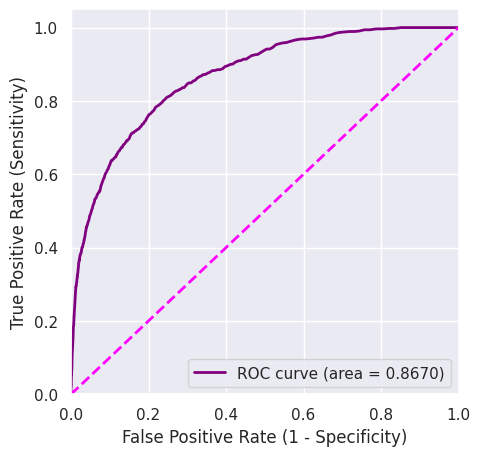

In [ ]:
# ROC Chart with AUC Plot
sns.set_style("darkgrid")
plt.figure(figsize=[5, 5])
plt.plot(fpr, tpr, color='purple',
 lw=2, label='ROC curve (area = %0.4f)' % roc_aucrft)
plt.plot([0, 1], [0, 1], color='magenta', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.legend(loc="lower right")

* Although random forest is a powerful model in identifying the leading indicators, it has limitations with respect to interpretability.Hence, a complementing modeling technique was explored to overcome these limitations, and this is logistic regression.

['V_ConstCap_Asset_R', 'S_TotalLiab_DailyEBITDA_R', 'P_GP_Margin2_R', 'S_Financial_Coverage_R', 'V_RE_Asset_R']


/tmp/ipykernel_51291/228170849.py:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = cm.get_cmap(cmap_name)(norm(importances))
/tmp/ipykernel_51291/228170849.py:30: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set(yticklabels=r)


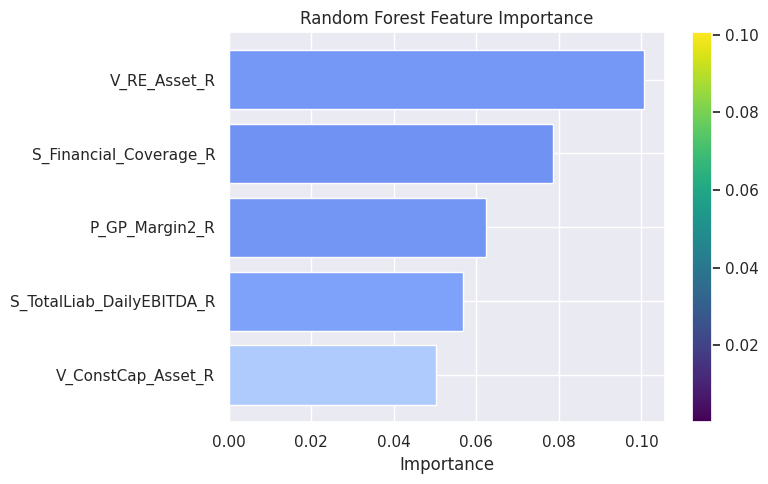

In [ ]:
# See what these variables are

importances = rf.feature_importances_  # Store array as an object
std = np.std([rf.feature_importances_ for tree in rf.estimators_], axis=0)
threshold = 0.05


# Create a dataframe for importances and std
rftree_featimp  = pd.DataFrame({'feature': train_X.columns, 'importance': importances, 'std': std})
rftree_featimp = rftree_featimp[rftree_featimp['importance']>=threshold]
rftree_featimp  = rftree_featimp.sort_values('importance') # Sort based on importance in asc order (default)


r=list(rftree_featimp ['feature'])
print(r)

norm = Normalize(vmin=min(importances), vmax=max(importances))

cmap_name = 'coolwarm'  # Choose a diverging colormap
colors = cm.get_cmap(cmap_name)(norm(importances))



# Create a figure and an axis
fig, ax = plt.subplots(figsize=(8, 5))

# Plot the horizontal bar graph
bars = ax.barh(r, rftree_featimp['importance'], color=colors)
ax.set_xlabel('Importance')
ax.set(yticklabels=r)
ax.set_title('Random Forest Feature Importance')

sm = plt.cm.ScalarMappable(cmap='viridis', norm=norm)
sm.set_array([])
plt.colorbar(sm, ax=ax)


plt.tight_layout()
plt.show()

* Because of the potential of Random Forest, it was selected as feature selection technique due to its inherent ability to rank features based on their importance.

* The most important features ordered from highest to lowest are:  “Retained Earnings to Asset”,  “Financial Coverage Ratio”, “Gross Profit Margin”, “Total Liability to Daily EBITDA”, and “ Constant Capital to Asset”.

* Based on the features revealed by the random forest, leading indicators of bankruptcy are related to the firm’s profitability (earnings’ capacity), leverage (level of debt financing), and solvency (ability to fulfill debt obligations)




## Logistic Regression

* The input variables selected by Random Forest were subjected to Logistic Regression.
* This is to understand the influence of variables to probability of Bankruptcy

In [ ]:
#fit the selected features of Random Forest to logistic regression model

train_XBR = train_Xsm[r]
valid_XBR = valid_X[r]

### 2a. Simple Logistic

In [ ]:
#Build and Fit a Model
log_reg = LogisticRegression(random_state=1, solver='liblinear', C=1e42)
log_reg.fit(train_XBR, train_ysm)

LogisticRegression(C=1e+42, random_state=1, solver='liblinear')

In [ ]:
# Crate Dataframe for coef and odds ratio

odds=pd.DataFrame({'variable': train_XBR.columns,'coef':log_reg.coef_[0], 'odds': np.e**log_reg.coef_[0].round(2)})
odds.sort_values(by='odds', ascending=True)

,variable,coef,odds
2,P_GP_Margin2_R,-6.107876,0.002221
4,V_RE_Asset_R,-3.529628,0.029305
0,V_ConstCap_Asset_R,-1.771750,0.170333
1,S_TotalLiab_DailyEBITDA_R,-0.363556,0.697676
3,S_Financial_Coverage_R,-0.006627,0.990050


* Results of odds ratio in simple logistic regression reveal that , for every increase in the percentage of 5 ratios, the lower the likelihood of Bankruptcy

In [ ]:
#Create Data Frame for the Log Result
log_reg_prob = log_reg.predict_proba(valid_XBR)
log_reg_pred = log_reg.predict(valid_XBR)

log_result = pd.DataFrame({'actual': valid_y,
                           'p_0':[p[0] for p in log_reg_prob],
                           'p_1':[p[1] for p in log_reg_prob],
                           'predicted': log_reg_pred})

In [ ]:
fpr, tpr, _ = roc_curve(log_result['actual'], log_result['p_1'])
roc_auclogrg = auc(fpr, tpr)

#Classification Summary
print("Train:",classificationSummary(train_ysm, log_reg.predict(train_XBR)))
print("")
print("Valid:",classificationSummary(valid_y, log_reg.predict(valid_XBR)))

# Classification Report
logreg_predictions=log_reg.predict(valid_XBR)

print('\nClassification Report\n')
simplog = classification_report(valid_y, logreg_predictions , target_names=['Operating', 'Bankrupt'],output_dict=True)
print(classification_report(valid_y, logreg_predictions , target_names=['Operating', 'Bankrupt']))

print('\nROC_AUC:\n', roc_auclogrg.round(4))

Confusion Matrix (Accuracy 0.6885)

       Prediction
Actual     0     1
     0 17291  7497
     1  7944 16844
Train: None

Confusion Matrix (Accuracy 0.6908)

       Prediction
Actual     0     1
     0 11444  5082
     1   286   550
Valid: None

Classification Report

              precision    recall  f1-score   support

   Operating       0.98      0.69      0.81     16526
    Bankrupt       0.10      0.66      0.17       836

    accuracy                           0.69     17362
   macro avg       0.54      0.68      0.49     17362
weighted avg       0.93      0.69      0.78     17362


ROC_AUC:
 0.7419


* Compared to tree-based models, simple logistic regression has low F1_score and ROC


### 2b. Grid Search Logistic - Tune the simple Logistic

* To tune the model’s performance, exhaustive grid search cross validation was also used.

In [ ]:
from sklearn.model_selection import GridSearchCV

In [ ]:
#Tune the logistic regression using grid search CV
parameters = [{'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']},
              {'penalty':['none', 'elasticnet', 'l1', 'l2']},
              {'C':[0.001, 0.01, 0.1, 1, 10, 100]},
              {'max_iter':[1,10,100,1000]}]



grid_search= GridSearchCV(estimator = LogisticRegression(),
                           param_grid = parameters,
                           scoring = 'accuracy',
                           cv = 5,
                           verbose=0)


# Fit the model
grid_search.fit(train_XBR, train_ysm)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:11

GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid=[{'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag',
                                     'saga']},
                         {'penalty': ['none', 'elasticnet', 'l1', 'l2']},
                         {'C': [0.001, 0.01, 0.1, 1, 10, 100]},
                         {'max_iter': [1, 10, 100, 1000]}],
             scoring='accuracy')

* Parameter grid was set comprising different optimization algorithm, type of regularization penalties, strength of inverse regularization, and maximum number of iterations.

In [ ]:
# Crate Dataframe for coef and odds ratio for GridLogit

odds=pd.DataFrame({'variable': train_XBR.columns,'coef':grid_search.best_estimator_.coef_[0], 'odds': np.e**grid_search.best_estimator_.coef_[0].round(2)})
odds.sort_values(by='odds', ascending=True)

,variable,coef,odds
2,P_GP_Margin2_R,-4.881850,0.007597
4,V_RE_Asset_R,-3.413223,0.033041
0,V_ConstCap_Asset_R,-1.792786,0.166960
1,S_TotalLiab_DailyEBITDA_R,-0.411522,0.663650
3,S_Financial_Coverage_R,-0.018299,0.980199


In [ ]:
gridlogis_prob = grid_search.predict_proba(valid_XBR)
gridlogis_pred = grid_search.predict(valid_XBR)

gridlogis_result = pd.DataFrame({'actual': valid_y,
                           'p_0':[p[0] for p in gridlogis_prob],
                           'p_1':[p[1] for p in gridlogis_prob],
                           'predicted': log_reg_pred})

In [ ]:
fpr, tpr, _ = roc_curve(gridlogis_result['actual'], gridlogis_result['p_1'])
roc_aucgdlog = auc(fpr, tpr)

#Classification Summary
print("Train:",classificationSummary(train_ysm, grid_search.predict(train_XBR)))
print("")
print("Valid:",classificationSummary(valid_y, grid_search.predict(valid_XBR)))

#Classification Report
loggrid_predictions=grid_search.predict(valid_XBR)

print('\nClassification Report\n')
gsearcglog=classification_report(valid_y, loggrid_predictions , target_names=['Operating', 'Bankrupt'],output_dict=True)
print(classification_report(valid_y, loggrid_predictions , target_names=['Operating', 'Bankrupt']))

print('\nROC_AUC:\n', roc_aucgdlog.round(4))

Confusion Matrix (Accuracy 0.6886)

       Prediction
Actual     0     1
     0 17375  7413
     1  8024 16764
Train: None

Confusion Matrix (Accuracy 0.6951)

       Prediction
Actual     0     1
     0 11516  5010
     1   284   552
Valid: None

Classification Report

              precision    recall  f1-score   support

   Operating       0.98      0.70      0.81     16526
    Bankrupt       0.10      0.66      0.17       836

    accuracy                           0.70     17362
   macro avg       0.54      0.68      0.49     17362
weighted avg       0.93      0.70      0.78     17362


ROC_AUC:
 0.7419


* Tuned Logistic Regression has slightly better result than the simple logistic regression
* Additionally,sequential selection techniques such as Stepwise and Recursive Feature Elimination (RFE) were employed to identify those best set of leading indicators that strongly influence the likelihood of bankruptcy.

### 2c. Forward Stepwise Regression - Sequential Input Selection

In [ ]:
from sklearn import linear_model
from mlxtend.feature_selection import SequentialFeatureSelector

In [ ]:
# Perform stepwise regression
sfs = SequentialFeatureSelector(linear_model.LogisticRegression(),
                                k_features=3,
                                forward=True,
                                scoring='accuracy',
                                cv=None)
selected_features = sfs.fit(train_XBR, train_ysm)

In [ ]:
#Check the features selected by Stepwise
selected=list((selected_features.k_feature_names_))
selected

['V_ConstCap_Asset_R', 'P_GP_Margin2_R', 'V_RE_Asset_R']

* Forward Stepwise selection was employed to search for the three statistically significant features using accuracy as the performance metric. Forward Stepwise works by starting with no variables and iteratively adding features if they meet the p-value cut-off of at least 0.05. The three statistically significant features selected by stepwise regression are: Contant Capital to Asset, Gross Profit Margin, and Retained Earnings to Asset

In [ ]:
#fit the selected features of stepwise in logistic regression model

train_XSW = train_XBR[selected]
valid_XSW = valid_XBR[selected]

In [ ]:
#Build and Fit a Model
log_regSW = LogisticRegression(random_state=1, solver='liblinear', C=1e42)
log_regSW.fit(train_XSW, train_ysm)

LogisticRegression(C=1e+42, random_state=1, solver='liblinear')

In [ ]:
# Crate Dataframe for coef and odds ratio

odds=pd.DataFrame({'variable': selected,'coef':log_regSW.coef_[0], 'odds': np.e**log_regSW.coef_[0]})
odds.sort_values(by='odds', ascending=True)

,variable,coef,odds
1,P_GP_Margin2_R,-6.528725,0.001461
2,V_RE_Asset_R,-3.465198,0.031267
0,V_ConstCap_Asset_R,-1.737724,0.175920


In [ ]:
#Dataframe of Result
log_regSW_prob = log_regSW.predict_proba(valid_XSW)
log_regSW_pred = log_regSW.predict(valid_XSW)

log_resultSW = pd.DataFrame({'actual': valid_y,
                           'p_0':[p[0] for p in log_reg_prob],
                           'p_1':[p[1] for p in log_reg_prob],
                           'predicted': log_reg_pred})

In [ ]:
fpr, tpr, _ = roc_curve(log_resultSW['actual'], log_resultSW['p_1'])
roc_auclgSW = auc(fpr, tpr)

#Classification Summary
print("Train:",classificationSummary(train_ysm, log_regSW.predict(train_XSW)))
print("")
print("Valid:",classificationSummary(valid_y, log_regSW.predict(valid_XSW)))

#Classification Report
logregSW_predictions=log_regSW.predict(valid_XSW)

print('\nClassification Report\n')
swreg=classification_report(valid_y, logregSW_predictions , target_names=['Operating', 'Bankrupt'],output_dict=True)
print(classification_report(valid_y, logregSW_predictions , target_names=['Operating', 'Bankrupt']))

print('\nROC_AUC:\n', roc_auclgSW.round(4))

Confusion Matrix (Accuracy 0.6908)

       Prediction
Actual     0     1
     0 17029  7759
     1  7569 17219
Train: None

Confusion Matrix (Accuracy 0.6818)

       Prediction
Actual     0     1
     0 11275  5251
     1   273   563
Valid: None

Classification Report

              precision    recall  f1-score   support

   Operating       0.98      0.68      0.80     16526
    Bankrupt       0.10      0.67      0.17       836

    accuracy                           0.68     17362
   macro avg       0.54      0.68      0.49     17362
weighted avg       0.93      0.68      0.77     17362


ROC_AUC:
 0.7419


* Logistic regression trained on input selected by Stepwise Regression has slightly worse accuracy result versus the previously tuned model,
* However, with respect to ROC_AUC it has same results

### 2d. Recursive Feature Elimination (RFE)

In [ ]:
from sklearn.feature_selection import RFE
from sklearn.ensemble import AdaBoostRegressor
from numpy import array

In [ ]:
#RFE selection using AdaBoost as the estimator

estimator = AdaBoostRegressor(random_state=0, n_estimators=100)
rfe_reg = RFE(estimator, n_features_to_select=5, step=1)
rfe_reg = rfe_reg.fit(train_XBR, train_ysm)

filter = rfe_reg.support_
ranking = rfe_reg.ranking_

ranking

array([1, 1, 1, 1, 1])

* RFE selection was trained in combination with AdaBoost regressor as an estimator. RFE works by starting with all features and iteratively removing the least significant ones based on their contribution to model performance.
* One of the advantages of RFE over other sequential regressions is its systematic approach of identifying important variables. It has feature importance ranking attribute.
* Based on the results of RFE, all features were ranked as 1, indicating that all features selected by random forest are all statistically significant.

In [ ]:
features = array(train_XBR.columns)
ada_impfeat=features[filter] #Features selected by RFE

In [ ]:
#fit the selected features of RFE in logistic regression model

train_XRF = train_XBR[ada_impfeat]
valid_XRF = valid_XBR[ada_impfeat]

In [ ]:
#Build and Fit a Model
rfe_reg = LogisticRegression(random_state=1, solver='liblinear', C=1e42)
rfe_reg.fit(train_XRF, train_ysm)

LogisticRegression(C=1e+42, random_state=1, solver='liblinear')

In [ ]:
#Dataframe for RFE
logrfe_reg_prob = rfe_reg.predict_proba(valid_XRF)
logrfe_reg_pred = rfe_reg.predict(valid_XRF)

logrfe_result = pd.DataFrame({'actual': valid_y,
                           'p_0':[p[0] for p in logrfe_reg_prob],
                           'p_1':[p[1] for p in logrfe_reg_prob],
                           'predicted': logrfe_reg_pred})

In [ ]:
fpr, tpr, _ = roc_curve(logrfe_result['actual'], logrfe_result['p_1'])
roc_auclgRF = auc(fpr, tpr)

#Classification Summary
print("Train:",classificationSummary(train_ysm, rfe_reg.predict(train_XRF)))
print("")
print("Valid:",classificationSummary(valid_y, rfe_reg.predict(valid_XRF)))


#Classification Report
logrfe_predictions=rfe_reg.predict(valid_XRF)

print('\nClassification Report\n')
rfereg=classification_report(valid_y, logrfe_predictions , target_names=['Operating', 'Bankrupt'],output_dict=True)
print(classification_report(valid_y, logrfe_predictions , target_names=['Operating', 'Bankrupt']))

print('\nROC_AUC:\n', roc_auclgRF.round(4))

Confusion Matrix (Accuracy 0.6885)

       Prediction
Actual     0     1
     0 17291  7497
     1  7944 16844
Train: None

Confusion Matrix (Accuracy 0.6908)

       Prediction
Actual     0     1
     0 11444  5082
     1   286   550
Valid: None

Classification Report

              precision    recall  f1-score   support

   Operating       0.98      0.69      0.81     16526
    Bankrupt       0.10      0.66      0.17       836

    accuracy                           0.69     17362
   macro avg       0.54      0.68      0.49     17362
weighted avg       0.93      0.69      0.78     17362


ROC_AUC:
 0.7419


* Results show that RFE logistic regression model perform fairly with previously trained regression models.
* However, considering the advantages of Recursive Feature Elimination (RFE), it was selected to be the best input selection technique for logistic regression model; mainly due to its robustness in handling complex data relationships.

In [ ]:
# Crate Dataframe for coef and odds ratio

odds=pd.DataFrame({'variable': ada_impfeat,'coef':rfe_reg.coef_[0], 'odds': np.e**rfe_reg.coef_[0]})
odds.sort_values(by='odds', ascending=True)

,variable,coef,odds
2,P_GP_Margin2_R,-6.107876,0.002225
4,V_RE_Asset_R,-3.529628,0.029316
0,V_ConstCap_Asset_R,-1.771750,0.170035
1,S_TotalLiab_DailyEBITDA_R,-0.363556,0.695200
3,S_Financial_Coverage_R,-0.006627,0.993395


In [ ]:
# Crate Dataframe for coef and odds ratio

odds_rev=pd.DataFrame({'variable': ada_impfeat,'intercept': rfe_reg.intercept_[0].round(2),
                       'coef': rfe_reg.coef_[0].round(2),
                       'odds': np.e**rfe_reg.coef_[0].round(2),
                       'reverse_odds': (1/(np.e**rfe_reg.coef_[0])).round(2)})

print(odds_rev.sort_values(by='reverse_odds', ascending=False))

                    variable  intercept  coef      odds  reverse_odds
2             P_GP_Margin2_R       1.08 -6.11  0.002221        449.38
4               V_RE_Asset_R       1.08 -3.53  0.029305         34.11
0         V_ConstCap_Asset_R       1.08 -1.77  0.170333          5.88
1  S_TotalLiab_DailyEBITDA_R       1.08 -0.36  0.697676          1.44
3     S_Financial_Coverage_R       1.08 -0.01  0.990050          1.01


* The odds ratios results of RFE Logistic regression were generated to determine the impact of every increase in t ratios to the likelihood of bankruptcy.
* The reverse odds ratios were also generated to determine the impact if the variables decrease.



**Interpretation:**

Based on the results of the odds ratios generated from RFE Logistic Regression, the financial metrics with strongest influence using at least 80% threshold are: *Gross Profit Margin*, *Retained Earnings to Asset*, and *Constant Capital to Asset*. The Interpretation of odds ratios are as follows:

* Gross Profit Margin: The risk of bankruptcy decreases by 99.8% for every percentage increase in gross profit margin; on the other hand, bankruptcy risk increases by 449 times for every percentage decrease.
* Retained Earnings to Asset: The risk of bankruptcy decreases by 96.9% for every percentage increase in retained earnings to asset; on the other hand, bankruptcy risk increases by 34 times for every percentage decrease.
* Constant Capital to Asset: The risk of bankruptcy decreases by 83% for every percentage increase in constant capital to asset; on the other hand, bankruptcy risk increases by 6 times for every percentage decrease.


Text(0.5, 1.0, ' ROC_AUC ')

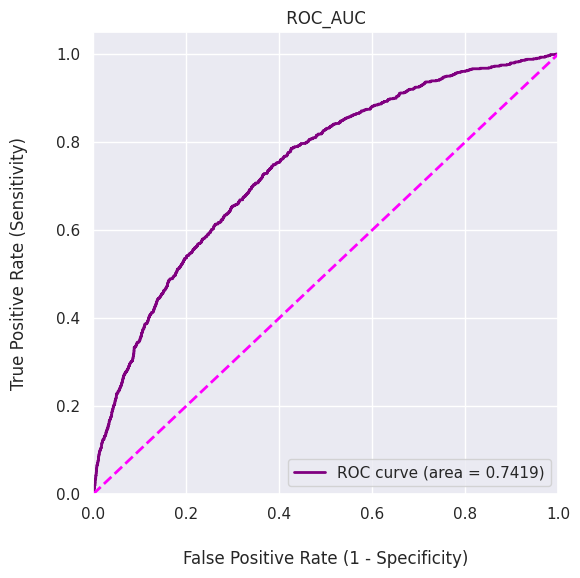

In [ ]:
# ROC Chart with AUC of RFE Logistic Regression

fpr, tpr, _ = roc_curve(logrfe_result['actual'], logrfe_result['p_1'])
roc_auc = auc(fpr, tpr)
plt.figure(figsize=[6, 6])
plt.plot(fpr, tpr, color='purple',
 lw=2, label='ROC curve (area = %0.4f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='magenta', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (1 - Specificity)', labelpad=20)
plt.ylabel('True Positive Rate (Sensitivity)', labelpad=20)
plt.legend(loc="lower right")
plt.title(" ROC_AUC ")

* RFE Logistic Regression has 74.19% effectivity in distinguishing bankrupt from operating firms.

<Axes: title={'center': 'Decile Lift Chart'}, xlabel='Percentile', ylabel='Lift'>

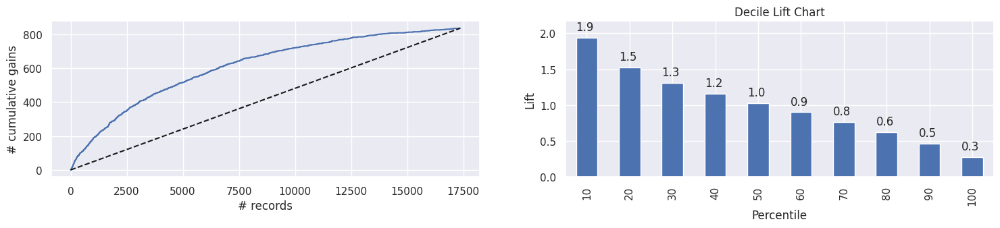

In [ ]:
# Gains Chart and Lift Chart of RFE Logistic Regression

df = logrfe_result.sort_values(by=['p_1'], ascending=False)
understand=conso_cleaned.loc[df.index]
predbankrupt= understand[(understand['Bankrupt'] == 1)]
predoperating= understand[(understand['Bankrupt'] == 0)]

fig, axes = plt.subplots(1,2, figsize=(18,3))
gainsChart(df.actual,ax=axes[0])

liftChart(df['p_1'], ax=axes[1])

* The model is better than just random guessing or no model at all by 1.9 and 1.5 times for the top 10% and 20%, respectively.

More sophisticated models were also explored such as: Neural Network , Bagging Classifier, and XG Boost

###Nueral Network

In [ ]:
#Train Neural Network based on features selected by Random Forest to compare with Logistic

clf=MLPClassifier(random_state=1, activation='logistic', solver='lbfgs', hidden_layer_sizes=3)
clf.fit(train_XBR, train_ysm)

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


MLPClassifier(activation='logistic', hidden_layer_sizes=3, random_state=1,
              solver='lbfgs')

In [ ]:
#Dataframe of Results
nn_prob = clf.predict_proba(valid_XBR)
nn_pred = clf.predict(valid_XBR)

nn_result = pd.DataFrame({'actual': valid_y,
                           'p_0':[p[0] for p in nn_prob],
                           'p_1':[p[1] for p in nn_prob],
                           'predicted': nn_pred})

In [ ]:
# Neural performance
fpr, tpr, _ = roc_curve(nn_result['actual'], nn_result['p_1'])
roc_aucnn = auc(fpr, tpr)

#Classification Summary
print("Train:",classificationSummary(train_ysm, clf.predict(train_XBR)))
print("")
print("Valid:",classificationSummary(valid_y, clf.predict(valid_XBR)))

neural_predictions = clf.predict(valid_XBR)

print('\nClassification Report: Neural Network \n')
print(classification_report(valid_y, neural_predictions  , target_names=['Operating', 'Bankrupt']))

print('\nROC_AUC:\n', roc_aucnn.round(4))

Confusion Matrix (Accuracy 0.7411)

       Prediction
Actual     0     1
     0 17333  7455
     1  5382 19406
Train: None

Confusion Matrix (Accuracy 0.6997)

       Prediction
Actual     0     1
     0 11513  5013
     1   201   635
Valid: None

Classification Report: Neural Network 

              precision    recall  f1-score   support

   Operating       0.98      0.70      0.82     16526
    Bankrupt       0.11      0.76      0.20       836

    accuracy                           0.70     17362
   macro avg       0.55      0.73      0.51     17362
weighted avg       0.94      0.70      0.79     17362


ROC_AUC:
 0.7865


* The results show that Neural Network outperforms logistic regression with respect to identifying bankrupt firms. But in terms of overall accuracy and ROC_AUC, they are almost at par.

### Bagging Classifier

In [ ]:
#Bagging classifier trained on same set of features with Random Forest

bagging=BaggingClassifier(DecisionTreeClassifier(random_state=1),n_estimators=100,random_state=1)
bagging.fit(train_Xsm, train_ysm)

BaggingClassifier(estimator=DecisionTreeClassifier(random_state=1),
                  n_estimators=100, random_state=1)

In [ ]:
# Evaluation with Accuracy and ROC_AUC

probs = bagging.predict_proba(valid_X)
preds = probs[:, 1]
fpr, tpr, threshold = metrics.roc_curve(valid_y, preds)
roc_aucbg = metrics.auc(fpr, tpr)

#Classification Summary
print("Train:",classificationSummary(train_ysm, bagging.predict(train_Xsm)))
print("")
print("Valid:",classificationSummary(valid_y, bagging.predict(valid_X)))

#Classification Report
bagging_predictions = bagging.predict(valid_X)

print('\nClassification Report: Bagging Classifier\n')
bagtree=classification_report(valid_y, bagging_predictions  , target_names=['Operating', 'Bankrupt'],output_dict=True)
print(classification_report(valid_y, bagging_predictions  , target_names=['Operating', 'Bankrupt']))

print('\nROC_AUC:\n', roc_aucbg.round(4))

Confusion Matrix (Accuracy 1.0000)

       Prediction
Actual     0     1
     0 24788     0
     1     0 24788
Train: None

Confusion Matrix (Accuracy 0.9386)

       Prediction
Actual     0     1
     0 15942   584
     1   482   354
Valid: None

Classification Report: Bagging Classifier

              precision    recall  f1-score   support

   Operating       0.97      0.96      0.97     16526
    Bankrupt       0.38      0.42      0.40       836

    accuracy                           0.94     17362
   macro avg       0.67      0.69      0.68     17362
weighted avg       0.94      0.94      0.94     17362


ROC_AUC:
 0.8643


* Compared to the Random Forest, Bagging Classifier seems to underperform

### XG Boost

In [ ]:
import xgboost as xgb
from sklearn.model_selection import StratifiedKFold
# Set the hyperparameter grid
param_grid = {
    'learning_rate': [0.1, 0.5, 1],
    'max_depth': [3, 5, 7],
    'n_estimators': [10, 50, 100]
}

# Define the model
xgtreehyp = xgb.XGBClassifier()

# Use stratified k-fold cross-validation to tune the hyperparameters
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
grid_searchxg = GridSearchCV(xgtreehyp , param_grid, cv=cv)
grid_searchxg.fit(train_Xsm, train_ysm)

# Print the best hyperparameters
print(f'Best learning rate: {grid_searchxg.best_params_["learning_rate"]}')
print(f'Best max depth: {grid_searchxg.best_params_["max_depth"]}')
print(f'Best number of estimators: {grid_searchxg.best_params_["n_estimators"]}')

Best learning rate: 0.5
Best max depth: 7
Best number of estimators: 100


In [ ]:
# Evaluation with Accuracy and ROC_AUC

probs = grid_searchxg.predict_proba(valid_X)
preds = probs[:, 1]
fpr, tpr, threshold = metrics.roc_curve(valid_y, preds)
roc_aucxgb = metrics.auc(fpr, tpr)

#Classification Summary
print("Train:",classificationSummary(train_ysm, grid_searchxg.predict(train_Xsm)))
print("")
print("Valid:",classificationSummary(valid_y, grid_searchxg.predict(valid_X)))

#Classification Report
xgtreehyp_predictions = grid_searchxg.predict(valid_X)

print('\nClassification Report: XG Boost\n')
xgbhyp = classification_report(valid_y, xgtreehyp_predictions  , target_names = ['Operating', 'Bankrupt'],output_dict=True)
print(classification_report(valid_y, xgtreehyp_predictions  , target_names = ['Operating', 'Bankrupt']))

print('\nROC_AUC:\n', roc_aucxgb.round(4))

Confusion Matrix (Accuracy 0.9998)

       Prediction
Actual     0     1
     0 24782     6
     1     3 24785
Train: None

Confusion Matrix (Accuracy 0.9556)

       Prediction
Actual     0     1
     0 16176   350
     1   421   415
Valid: None

Classification Report: XG Boost

              precision    recall  f1-score   support

   Operating       0.97      0.98      0.98     16526
    Bankrupt       0.54      0.50      0.52       836

    accuracy                           0.96     17362
   macro avg       0.76      0.74      0.75     17362
weighted avg       0.95      0.96      0.95     17362


ROC_AUC:
 0.9016


* XGBoost delivered a very promising result with F1-score of 0.52 and ROC_AUC of 90.16, indicating a high predictive power considering the degree of data imbalance.

# Comparison of Model Performance

Summary of Validation Performance for all explored models above

In [ ]:
#Summary of model predictions
models=[fulldecisiontree_predictions,gsdecisiontree_predictions,
        rf_predictions,bagging_predictions,
        xgtreehyp_predictions,logreg_predictions,loggrid_predictions,
        logregSW_predictions,logrfe_predictions,
        neural_predictions]

In [ ]:
#Decision Tree
dtmodels=[fulldecisiontree_predictions,gsdecisiontree_predictions,
        rf_predictions,bagging_predictions,xgtreehyp_predictions]

summary_data = []

for col_name in dtmodels:
        precision = precision_score(valid_y,col_name,pos_label=1)
        recall =  recall_score(valid_y,col_name, average="binary")
        f1score = f1_score(valid_y,col_name)
        accuracy =  accuracy_score(valid_y,col_name)

        summary_data.append({
            'Precision': precision,
            'Recall': recall,
            'F1_Score':f1score,
            'Accuracy':accuracy
        })

DecisionTree_Eval=pd.DataFrame(summary_data).round(2)

#List of Models
DecisionTree_Models=['FullClassTree','GridClassTree','RandomForest','BaggingClassifier', 'XGBoost']

DecisionTree_Eval['DecisionTree_Models'] = DecisionTree_Models
DecisionTree_Eval=DecisionTree_Eval[['DecisionTree_Models','Precision','Recall','F1_Score','Accuracy']]
DecisionTree_Eval.set_index('DecisionTree_Models', inplace = True)

In [ ]:
#Logistic Regression and Neural Network

lgNeumodels=[logreg_predictions,loggrid_predictions,
        logregSW_predictions,logrfe_predictions,neural_predictions]

summary_data = []

for col_name in lgNeumodels:
        precision = precision_score(valid_y,col_name,pos_label=1)
        recall =  recall_score(valid_y,col_name, average="binary")
        f1score = f1_score(valid_y,col_name)
        accuracy =  accuracy_score(valid_y,col_name)

        summary_data.append({
            'Precision': precision,
            'Recall': recall,
            'F1_Score':f1score,
            'Accuracy':accuracy
        })

LogisticReg_Eval=pd.DataFrame(summary_data).round(2)

#List of Models
LogisticReg_Models=['SimpleLogReg','GridClassLogReg','StepwiseReg','RFEReg',"Neural"]

LogisticReg_Eval['LogisticRegression_Models'] = LogisticReg_Models
LogisticReg_Eval=LogisticReg_Eval[['LogisticRegression_Models','Precision','Recall','F1_Score','Accuracy']]
LogisticReg_Eval.set_index('LogisticRegression_Models', inplace = True)

In [ ]:
roc=[roc_aucsft,roc_aucgct,roc_aucrft,roc_aucbg,roc_aucxgb,
     roc_auclogrg,roc_aucgdlog,roc_auclgSW ,roc_auclgRF,roc_aucnn]

In [ ]:
roc=[roc_aucsft,roc_aucgct,roc_aucrft,roc_aucbg,roc_aucxgb,
     roc_auclogrg,roc_aucgdlog,roc_auclgSW ,roc_auclgRF,roc_aucnn]

summary_data = []

for col_name in roc:
        ROC_AUC = col_name.round(2)

        summary_data.append({
            'ROC_AUC': ROC_AUC,
        })

ROC_AUCsum=pd.DataFrame(summary_data).round(4)

Models=['FullClassTree','GridClassTree','RandomForest','BaggingClassifier', 'XGBoost',
        'SimpleLogReg','GridClassLogReg','StepwiseReg','RFEReg',"Neural"]

ROC_AUCsum['Models'] = Models
ROC_AUCsum.set_index('Models', inplace = True)

In [ ]:
#Summary of All

ModelEvaluation_Summary= pd.concat([DecisionTree_Eval,LogisticReg_Eval])
ModelEvaluation_Summary= pd.concat([ModelEvaluation_Summary,ROC_AUCsum],axis=1)
ModelEvaluation_Summary

,Precision,Recall,F1_Score,Accuracy,ROC_AUC
FullClassTree,0.22,0.46,0.30,0.90,0.69
GridClassTree,0.15,0.45,0.23,0.85,0.79
RandomForest,0.45,0.38,0.41,0.95,0.87
BaggingClassifier,0.38,0.42,0.40,0.94,0.86
XGBoost,0.54,0.50,0.52,0.96,0.90
SimpleLogReg,0.10,0.66,0.17,0.69,0.74
GridClassLogReg,0.10,0.66,0.17,0.70,0.74
StepwiseReg,0.10,0.67,0.17,0.68,0.74
RFEReg,0.10,0.66,0.17,0.69,0.74
Neural,0.11,0.76,0.20,0.70,0.79


### Best Model

* The best model is the one with the highest predictive power based on F1-score and ROC_AUC; and also interpretability.
* Although Random Forest and XG Boost appeared to be very promising with respect to predictive power, they have limitations with respect to interpretability.
* Therefore, the best model selected is Logistic Regression in which its inputs undergone two stages of selection process; feature importance in Random Forest and subsequently variable significance through Recursive Feature Elimination (RFE).




* Based on the results of best model, which is RFE Logistic Regression, the leading financial indicators of corporate bankruptcy for manufacturing firms are: *Gross Profit Margin*, *Retained Earnings to Asset*, and *Constant Capital to Asset*

### Further Analysis-- based on correct predictions of RFE Logistic Regression

Comparative analysis on Firms with highest bankruptcy risk vs. firms with lowest bankruptcy risk with respect to the three leading financial

In [ ]:
# Extract Correct Predictions

# Bankrupt
bankrupt=logrfe_result.sort_values(by="p_1", ascending=False)
bankrupt=bankrupt[(bankrupt['predicted']==1)&(bankrupt['actual']==1)]

#Operating
operating=logrfe_result.sort_values(by="p_0", ascending=False)
operating=operating[(operating['predicted']==0)&(operating['actual']==0)]

#Consolidate correct predictions
sample=pd.concat([bankrupt,operating],axis=0)

In [ ]:
#Three leading indicators
lead=(odds_rev.sort_values(by='reverse_odds', ascending=False)).head(3)
lead=lead['variable']
lead=list(lead)
lead

['P_GP_Margin2_R', 'V_RE_Asset_R', 'V_ConstCap_Asset_R']

In [ ]:
# Subset data based on firms with highest and lowest risk and the three leading indicators

lead.extend(['Bankrupt','Year_Interval'])

foranalysis=conso_cleaned.loc[sample.index,lead]

In [ ]:
foranalysis.groupby(['Bankrupt','Year_Interval']).mean().round(3)

P_GP_Margin2_R  V_RE_Asset_R  V_ConstCap_Asset_R
Bankrupt Year_Interval                                                  
0        1                       0.078         0.074               0.680
         2                       0.074         0.065               0.694
         3                       0.077         0.063               0.689
         4                       0.081         0.067               0.678
         5                       0.087         0.083               0.662
1        1                      -0.075        -0.059               0.263
         2                      -0.069        -0.055               0.283
         3                      -0.044        -0.053               0.313
         4                      -0.027        -0.042               0.289
         5                      -0.014        -0.027               0.307

In [ ]:
#Exported to excel

filename='companalysis.xlsx'
foranalysis.to_excel(filename)

* Comparative Analysis was performed in Tableau, please see documentation in submitted word document for further details